In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


[I 2025-05-22 22:43:16,898] A new study created in memory with name: no-name-22312ad1-1c98-4626-a170-996f431a6e5f
[I 2025-05-22 22:46:27,476] Trial 0 finished with value: 0.08743446320295334 and parameters: {'lr': 0.0017671931145847976, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4730491055077425}. Best is trial 0 with value: 0.08743446320295334.


Cross Validation Accuracies:
[0.06323058158159256, 0.07722551375627518, 0.11251478642225266, 0.08748144656419754, 0.09671998769044876]
Mean Cross Validation Accuracy:
0.08743446320295334
Standard Deviation of Cross Validation Accuracy:
0.016764822215426634


[I 2025-05-22 22:50:37,346] Trial 1 finished with value: 0.07745033279061317 and parameters: {'lr': 0.001039020979258949, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2278382253275686}. Best is trial 1 with value: 0.07745033279061317.


Cross Validation Accuracies:
[0.05811282619833946, 0.07440726459026337, 0.09992508590221405, 0.08505270630121231, 0.06975378096103668]
Mean Cross Validation Accuracy:
0.07745033279061317
Standard Deviation of Cross Validation Accuracy:
0.014179893834339095


[I 2025-05-22 22:55:20,101] Trial 2 finished with value: 0.07534047812223435 and parameters: {'lr': 0.00678261487146155, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18165818451253918}. Best is trial 2 with value: 0.07534047812223435.


Cross Validation Accuracies:
[0.06162763014435768, 0.0556313656270504, 0.08770525455474854, 0.08009099960327148, 0.09164714068174362]
Mean Cross Validation Accuracy:
0.07534047812223435
Standard Deviation of Cross Validation Accuracy:
0.014267821903918811


[I 2025-05-22 23:00:53,136] Trial 3 finished with value: 0.07590566277503967 and parameters: {'lr': 0.003693186710909967, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2901910215868533}. Best is trial 2 with value: 0.07534047812223435.


Cross Validation Accuracies:
[0.0680905431509018, 0.08230812102556229, 0.07016908377408981, 0.09288889914751053, 0.06607166677713394]
Mean Cross Validation Accuracy:
0.07590566277503967
Standard Deviation of Cross Validation Accuracy:
0.010199153886410892


[I 2025-05-22 23:07:47,158] Trial 4 finished with value: 0.07333233132958412 and parameters: {'lr': 0.5030782776124505, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.20308812593772987}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[0.06379229575395584, 0.05728257820010185, 0.08066964149475098, 0.09525466710329056, 0.06966247409582138]
Mean Cross Validation Accuracy:
0.07333233132958412
Standard Deviation of Cross Validation Accuracy:
0.013390292249631966


[I 2025-05-22 23:16:49,202] Trial 5 finished with value: 0.538249808549881 and parameters: {'lr': 0.21543910168127403, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.47451981752147}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[0.6239790916442871, 0.40323007106781006, 0.4745056927204132, 0.36844539642333984, 0.8210887908935547]
Mean Cross Validation Accuracy:
0.538249808549881
Standard Deviation of Cross Validation Accuracy:
0.1664178957344035


[I 2025-05-22 23:24:01,555] Trial 6 finished with value: 0.077473945915699 and parameters: {'lr': 0.8612737635673671, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4756851672384764}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[0.05947168171405792, 0.07188770174980164, 0.07107184827327728, 0.11702138930559158, 0.0679171085357666]
Mean Cross Validation Accuracy:
0.077473945915699
Standard Deviation of Cross Validation Accuracy:
0.020256396095421535


[I 2025-05-22 23:30:49,256] Trial 7 finished with value: 0.07704749852418899 and parameters: {'lr': 0.0030489255708978607, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.47571549830938953}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[0.0767466276884079, 0.05020390450954437, 0.0817783772945404, 0.09036228060722351, 0.08614630252122879]
Mean Cross Validation Accuracy:
0.07704749852418899
Standard Deviation of Cross Validation Accuracy:
0.014164193820460762


[I 2025-05-22 23:35:40,413] Trial 8 finished with value: 0.09718409031629563 and parameters: {'lr': 0.13608322376680765, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22681168664858697}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[0.09323194622993469, 0.06228013336658478, 0.11397156119346619, 0.11857094615697861, 0.09786586463451385]
Mean Cross Validation Accuracy:
0.09718409031629563
Standard Deviation of Cross Validation Accuracy:
0.019867497331317867


[I 2025-05-22 23:41:09,589] Trial 9 finished with value: 10.180459308624268 and parameters: {'lr': 0.11312368892881786, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4766992798975386}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[12.988951683044434, 9.594996452331543, 8.66147518157959, 7.659797191619873, 11.997076034545898]
Mean Cross Validation Accuracy:
10.180459308624268
Standard Deviation of Cross Validation Accuracy:
2.0095543181754327


[I 2025-05-22 23:47:55,243] Trial 10 finished with value: 0.07791363820433617 and parameters: {'lr': 0.02270940126243672, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.10886695554914388}. Best is trial 4 with value: 0.07333233132958412.


Cross Validation Accuracies:
[0.06744708120822906, 0.059792693704366684, 0.09845580905675888, 0.08762680739164352, 0.07624579966068268]
Mean Cross Validation Accuracy:
0.07791363820433617
Standard Deviation of Cross Validation Accuracy:
0.013834923702881858


[I 2025-05-22 23:54:42,567] Trial 11 finished with value: 0.06665459871292115 and parameters: {'lr': 0.017964122894273703, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13232326889338367}. Best is trial 11 with value: 0.06665459871292115.


Cross Validation Accuracies:
[0.05316919460892677, 0.05605684593319893, 0.06609296053647995, 0.08527563512325287, 0.07267835736274719]
Mean Cross Validation Accuracy:
0.06665459871292115
Standard Deviation of Cross Validation Accuracy:
0.011640554888282846


[I 2025-05-23 00:00:33,264] Trial 12 finished with value: 0.0683302141726017 and parameters: {'lr': 0.020694650053475056, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1204749623760206}. Best is trial 11 with value: 0.06665459871292115.


Cross Validation Accuracies:
[0.05407140403985977, 0.05639275535941124, 0.08366978913545609, 0.07602977752685547, 0.07148734480142593]
Mean Cross Validation Accuracy:
0.0683302141726017
Standard Deviation of Cross Validation Accuracy:
0.011404998018525556


[I 2025-05-23 00:06:10,805] Trial 13 finished with value: 0.0696373887360096 and parameters: {'lr': 0.02116771929636674, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10573308789648383}. Best is trial 11 with value: 0.06665459871292115.


Cross Validation Accuracies:
[0.07118630409240723, 0.05596146360039711, 0.07199692726135254, 0.0807553380727768, 0.06828691065311432]
Mean Cross Validation Accuracy:
0.0696373887360096
Standard Deviation of Cross Validation Accuracy:
0.008005374165597033


[I 2025-05-23 00:11:48,892] Trial 14 finished with value: 0.13542401790618896 and parameters: {'lr': 0.046840208240418055, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.354936329738359}. Best is trial 11 with value: 0.06665459871292115.


Cross Validation Accuracies:
[0.11853322386741638, 0.12514956295490265, 0.14159534871578217, 0.14503590762615204, 0.1468060463666916]
Mean Cross Validation Accuracy:
0.13542401790618896
Standard Deviation of Cross Validation Accuracy:
0.011409536954952249


[I 2025-05-23 00:17:11,545] Trial 15 finished with value: 0.06491387411952018 and parameters: {'lr': 0.0086647162911997, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14943637789403946}. Best is trial 15 with value: 0.06491387411952018.


Cross Validation Accuracies:
[0.05690106004476547, 0.04824572429060936, 0.07085853815078735, 0.07850497215986252, 0.07005907595157623]
Mean Cross Validation Accuracy:
0.06491387411952018
Standard Deviation of Cross Validation Accuracy:
0.010849539035323473


[I 2025-05-23 00:22:20,527] Trial 16 finished with value: 0.06369104385375976 and parameters: {'lr': 0.008178045909127072, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14852115505240665}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052902087569236755, 0.049781009554862976, 0.07142113149166107, 0.08182501047849655, 0.06252598017454147]
Mean Cross Validation Accuracy:
0.06369104385375976
Standard Deviation of Cross Validation Accuracy:
0.01183083264795145


[I 2025-05-23 00:28:37,933] Trial 17 finished with value: 0.0693091832101345 and parameters: {'lr': 0.009106901840030228, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.28718689735701647}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.051557138562202454, 0.053402867168188095, 0.07236260920763016, 0.08650042116641998, 0.08272287994623184]
Mean Cross Validation Accuracy:
0.0693091832101345
Standard Deviation of Cross Validation Accuracy:
0.014511618187702267


[I 2025-05-23 00:33:56,052] Trial 18 finished with value: 0.06739943847060204 and parameters: {'lr': 0.0070222982506081486, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16772566454835824}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05326715484261513, 0.05355670303106308, 0.08158370852470398, 0.08129716664552689, 0.0672924593091011]
Mean Cross Validation Accuracy:
0.06739943847060204
Standard Deviation of Cross Validation Accuracy:
0.012535506171860179


[I 2025-05-23 00:40:10,895] Trial 19 finished with value: 0.13932294100522996 and parameters: {'lr': 0.04875192326021552, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.34336871302121585}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.1427140235900879, 0.12396801263093948, 0.12598763406276703, 0.14493124186992645, 0.1590137928724289]
Mean Cross Validation Accuracy:
0.13932294100522996
Standard Deviation of Cross Validation Accuracy:
0.012994509329494091


[I 2025-05-23 00:46:47,531] Trial 20 finished with value: 0.13165823072195054 and parameters: {'lr': 0.003908011077229211, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2602441536352723}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06976491957902908, 0.1544070690870285, 0.1617226004600525, 0.13473135232925415, 0.13766521215438843]
Mean Cross Validation Accuracy:
0.13165823072195054
Standard Deviation of Cross Validation Accuracy:
0.03255053253416036


[I 2025-05-23 00:53:04,998] Trial 21 finished with value: 0.06925620287656784 and parameters: {'lr': 0.010417607146616704, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1485830334885395}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05165356770157814, 0.048867348581552505, 0.08066302537918091, 0.09028365463018417, 0.07481341809034348]
Mean Cross Validation Accuracy:
0.06925620287656784
Standard Deviation of Cross Validation Accuracy:
0.01630159570321968


[I 2025-05-23 00:57:54,840] Trial 22 finished with value: 0.06722498312592506 and parameters: {'lr': 0.012120408784333687, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1489655164599096}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052008818835020065, 0.05094943195581436, 0.08028825372457504, 0.08973001688718796, 0.0631483942270279]
Mean Cross Validation Accuracy:
0.06722498312592506
Standard Deviation of Cross Validation Accuracy:
0.015428346521895673


[I 2025-05-23 01:02:40,421] Trial 23 finished with value: 0.1324813485145569 and parameters: {'lr': 0.051857826821415196, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14289881992206874}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.12990431487560272, 0.13033419847488403, 0.13031929731369019, 0.1416555643081665, 0.13019336760044098]
Mean Cross Validation Accuracy:
0.1324813485145569
Standard Deviation of Cross Validation Accuracy:
0.004589703980768529


[I 2025-05-23 01:07:58,645] Trial 24 finished with value: 0.07190505415201187 and parameters: {'lr': 0.013347909503704887, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19157651103973794}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06042960658669472, 0.05644884333014488, 0.06901083141565323, 0.09374210238456726, 0.07989388704299927]
Mean Cross Validation Accuracy:
0.07190505415201187
Standard Deviation of Cross Validation Accuracy:
0.013561968894766492


[I 2025-05-23 01:13:13,251] Trial 25 finished with value: 0.06624671593308448 and parameters: {'lr': 0.005354566877439998, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22114387649075423}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.053045760840177536, 0.05083473026752472, 0.07676704972982407, 0.0838407650589943, 0.06674527376890182]
Mean Cross Validation Accuracy:
0.06624671593308448
Standard Deviation of Cross Validation Accuracy:
0.012901713570497287


[I 2025-05-23 01:18:24,990] Trial 26 finished with value: 0.06513625085353851 and parameters: {'lr': 0.002232749081421797, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22997200973471657}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.051738496869802475, 0.04985114559531212, 0.07453104853630066, 0.08247775584459305, 0.06708280742168427]
Mean Cross Validation Accuracy:
0.06513625085353851
Standard Deviation of Cross Validation Accuracy:
0.012695773752643583


[I 2025-05-23 01:23:07,450] Trial 27 finished with value: 0.06513258963823318 and parameters: {'lr': 0.0019014195714857976, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2549201966991724}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.0518607497215271, 0.04918650537729263, 0.07520763576030731, 0.08372342586517334, 0.06568463146686554]
Mean Cross Validation Accuracy:
0.06513258963823318
Standard Deviation of Cross Validation Accuracy:
0.013250281764483954


[I 2025-05-23 01:27:42,210] Trial 28 finished with value: 0.1007883757352829 and parameters: {'lr': 0.0010214227858002093, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.34950730525686485}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.08614780008792877, 0.07149692624807358, 0.11019980907440186, 0.09014879912137985, 0.14594854414463043]
Mean Cross Validation Accuracy:
0.1007883757352829
Standard Deviation of Cross Validation Accuracy:
0.025743161993539397


[I 2025-05-23 01:31:15,398] Trial 29 finished with value: 0.31110329926013947 and parameters: {'lr': 0.0017998653240346993, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4217942987504617}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.31158849596977234, 0.3589664399623871, 0.24740652740001678, 0.3266421854496002, 0.3109128475189209]
Mean Cross Validation Accuracy:
0.31110329926013947
Standard Deviation of Cross Validation Accuracy:
0.03630396026607966


[I 2025-05-23 01:35:40,604] Trial 30 finished with value: 0.08004462122917175 and parameters: {'lr': 0.002613443256199747, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.26013572737240653}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05292801558971405, 0.10467429459095001, 0.07441521435976028, 0.09199795126914978, 0.07620763033628464]
Mean Cross Validation Accuracy:
0.08004462122917175
Standard Deviation of Cross Validation Accuracy:
0.01749986246329882


[I 2025-05-23 01:40:06,122] Trial 31 finished with value: 0.06571051180362701 and parameters: {'lr': 0.0019331173794114001, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2619045174238854}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05278743803501129, 0.05106674134731293, 0.07657371461391449, 0.08214198052883148, 0.06598268449306488]
Mean Cross Validation Accuracy:
0.06571051180362701
Standard Deviation of Cross Validation Accuracy:
0.012405823362792065


[I 2025-05-23 01:43:50,876] Trial 32 finished with value: 0.06537658050656318 and parameters: {'lr': 0.0014340509024031746, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16601400371177402}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05244893208146095, 0.05054755508899689, 0.07473951578140259, 0.08375107496976852, 0.06539582461118698]
Mean Cross Validation Accuracy:
0.06537658050656318
Standard Deviation of Cross Validation Accuracy:
0.012746066551784781


[I 2025-05-23 01:48:06,019] Trial 33 finished with value: 0.06575122401118279 and parameters: {'lr': 0.002379554595457605, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23518864430931555}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052458032965660095, 0.0506693460047245, 0.07636634260416031, 0.08360379189252853, 0.06565860658884048]
Mean Cross Validation Accuracy:
0.06575122401118279
Standard Deviation of Cross Validation Accuracy:
0.01292730036057344


[I 2025-05-23 01:52:28,001] Trial 34 finished with value: 0.07823550179600716 and parameters: {'lr': 0.0041033854533360555, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.30945038290370186}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06027868762612343, 0.05755831301212311, 0.09177606552839279, 0.10343959927558899, 0.07812484353780746]
Mean Cross Validation Accuracy:
0.07823550179600716
Standard Deviation of Cross Validation Accuracy:
0.01771213681257733


[I 2025-05-23 01:59:18,437] Trial 35 finished with value: 0.11156560331583024 and parameters: {'lr': 0.0014104473372334673, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1801654872820399}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.1329672932624817, 0.06677400320768356, 0.157648965716362, 0.12708403170108795, 0.07335372269153595]
Mean Cross Validation Accuracy:
0.11156560331583024
Standard Deviation of Cross Validation Accuracy:
0.03546537890211568


[I 2025-05-23 02:04:54,586] Trial 36 finished with value: 0.0690874695777893 and parameters: {'lr': 0.0055184914273014194, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20672733953301137}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05418041720986366, 0.04680740460753441, 0.09453471004962921, 0.07814471423625946, 0.07177010178565979]
Mean Cross Validation Accuracy:
0.0690874695777893
Standard Deviation of Cross Validation Accuracy:
0.017061147378629578


[I 2025-05-23 02:10:21,347] Trial 37 finished with value: 0.06713939383625984 and parameters: {'lr': 0.006712755633465049, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3127036350197265}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05506444349884987, 0.05384679138660431, 0.0810084268450737, 0.08118067681789398, 0.06459663063287735]
Mean Cross Validation Accuracy:
0.06713939383625984
Standard Deviation of Cross Validation Accuracy:
0.011987252017154544


[I 2025-05-23 02:17:32,437] Trial 38 finished with value: 0.06649217158555984 and parameters: {'lr': 0.0034900052626454592, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23920687790280135}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052082501351833344, 0.05153094232082367, 0.07843255251646042, 0.08372163027524948, 0.06669323146343231]
Mean Cross Validation Accuracy:
0.06649217158555984
Standard Deviation of Cross Validation Accuracy:
0.01319806308475579


[I 2025-05-23 02:25:39,859] Trial 39 finished with value: 0.22908183336257934 and parameters: {'lr': 0.03355578007959718, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4278877381898512}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.3295758366584778, 0.1478455364704132, 0.24462556838989258, 0.24152396619319916, 0.181838259100914]
Mean Cross Validation Accuracy:
0.22908183336257934
Standard Deviation of Cross Validation Accuracy:
0.06217193950357317


[I 2025-05-23 02:31:00,512] Trial 40 finished with value: 0.23205614984035491 and parameters: {'lr': 0.0013104525185520103, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2060819068068891}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.14748670160770416, 0.137409508228302, 0.28137660026550293, 0.2986448109149933, 0.2953631281852722]
Mean Cross Validation Accuracy:
0.23205614984035491
Standard Deviation of Cross Validation Accuracy:
0.07346333570405274


[I 2025-05-23 02:37:10,519] Trial 41 finished with value: 0.06581308394670486 and parameters: {'lr': 0.0013874212404206897, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16321959058457633}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052533987909555435, 0.051040660589933395, 0.07608649879693985, 0.0838233157992363, 0.06558095663785934]
Mean Cross Validation Accuracy:
0.06581308394670486
Standard Deviation of Cross Validation Accuracy:
0.012841528495860633


[I 2025-05-23 02:42:14,021] Trial 42 finished with value: 0.06573722884058952 and parameters: {'lr': 0.002204701931770171, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.17289023072319784}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052090421319007874, 0.050429973751306534, 0.0767098143696785, 0.08327948302030563, 0.06617645174264908]
Mean Cross Validation Accuracy:
0.06573722884058952
Standard Deviation of Cross Validation Accuracy:
0.013029724828683921


[I 2025-05-23 02:47:16,404] Trial 43 finished with value: 0.06487398222088814 and parameters: {'lr': 0.0029856939250192294, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18863449634119844}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05097333341836929, 0.05161210522055626, 0.07485094666481018, 0.08123988658189774, 0.06569363921880722]
Mean Cross Validation Accuracy:
0.06487398222088814
Standard Deviation of Cross Validation Accuracy:
0.012142157150738377


[I 2025-05-23 02:53:18,599] Trial 44 finished with value: 0.06563944444060325 and parameters: {'lr': 0.0031920041723387197, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1995459623543181}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05340658128261566, 0.049778375774621964, 0.07561005651950836, 0.08443343639373779, 0.0649687722325325]
Mean Cross Validation Accuracy:
0.06563944444060325
Standard Deviation of Cross Validation Accuracy:
0.01307129282238139


[I 2025-05-23 02:59:30,159] Trial 45 finished with value: 0.06573191955685616 and parameters: {'lr': 0.004846116960421694, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13082963543061576}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052218832075595856, 0.05148708447813988, 0.07670892775058746, 0.08438035100698471, 0.06386440247297287]
Mean Cross Validation Accuracy:
0.06573191955685616
Standard Deviation of Cross Validation Accuracy:
0.01309400766908286


[I 2025-05-23 03:04:06,069] Trial 46 finished with value: 0.5248846054077149 and parameters: {'lr': 0.008253865152041262, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2802331421427375}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.4804695248603821, 0.5811426639556885, 0.5125051736831665, 0.5353586673736572, 0.5149469971656799]
Mean Cross Validation Accuracy:
0.5248846054077149
Standard Deviation of Cross Validation Accuracy:
0.03316438117340531


[I 2025-05-23 03:09:26,909] Trial 47 finished with value: 0.07425365298986435 and parameters: {'lr': 0.01459734498110886, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.24044696420425324}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.07817133516073227, 0.06222815811634064, 0.08416429162025452, 0.08334173262119293, 0.06336274743080139]
Mean Cross Validation Accuracy:
0.07425365298986435
Standard Deviation of Cross Validation Accuracy:
0.009585265086465384


[I 2025-05-23 03:13:54,048] Trial 48 finished with value: 0.06500106602907181 and parameters: {'lr': 0.0024846393306585963, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10026281376102117}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052418824285268784, 0.04951613023877144, 0.07457024604082108, 0.08262898027896881, 0.06587114930152893]
Mean Cross Validation Accuracy:
0.06500106602907181
Standard Deviation of Cross Validation Accuracy:
0.012658322602376808


[I 2025-05-23 03:17:41,893] Trial 49 finished with value: 0.06535212844610214 and parameters: {'lr': 0.002794385829097797, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11299383941725863}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05278587341308594, 0.0497293621301651, 0.07508479058742523, 0.08352667838335037, 0.06563393771648407]
Mean Cross Validation Accuracy:
0.06535212844610214
Standard Deviation of Cross Validation Accuracy:
0.012861570566308989


[I 2025-05-23 03:21:07,809] Trial 50 finished with value: 0.10804038941860199 and parameters: {'lr': 0.03061361718772206, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12323317088727975}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.10268694907426834, 0.11399035900831223, 0.12016215920448303, 0.12189047783613205, 0.0814720019698143]
Mean Cross Validation Accuracy:
0.10804038941860199
Standard Deviation of Cross Validation Accuracy:
0.014890956484947593


[I 2025-05-23 03:26:16,451] Trial 51 finished with value: 0.06529405042529106 and parameters: {'lr': 0.002085769595677306, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.21792041974373805}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05187511444091797, 0.050784651190042496, 0.07492689788341522, 0.08344826847314835, 0.06543532013893127]
Mean Cross Validation Accuracy:
0.06529405042529106
Standard Deviation of Cross Validation Accuracy:
0.012751296791567225


[I 2025-05-23 03:31:03,318] Trial 52 finished with value: 0.06493358686566353 and parameters: {'lr': 0.004386682728704382, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13827808959446747}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05184008181095123, 0.05212259665131569, 0.07431446015834808, 0.08230175822973251, 0.06408903747797012]
Mean Cross Validation Accuracy:
0.06493358686566353
Standard Deviation of Cross Validation Accuracy:
0.012049305115426482


[I 2025-05-23 03:35:42,760] Trial 53 finished with value: 0.06658242717385292 and parameters: {'lr': 0.006563234589478975, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10350341333473018}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05430321395397186, 0.0504223071038723, 0.07805472612380981, 0.08504964411258698, 0.06508224457502365]
Mean Cross Validation Accuracy:
0.06658242717385292
Standard Deviation of Cross Validation Accuracy:
0.01331788910049014


[I 2025-05-23 03:40:28,134] Trial 54 finished with value: 0.06589860022068024 and parameters: {'lr': 0.004402840371278374, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13997952089996446}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.0521363765001297, 0.05010168254375458, 0.07479752600193024, 0.08724148571491241, 0.06521593034267426]
Mean Cross Validation Accuracy:
0.06589860022068024
Standard Deviation of Cross Validation Accuracy:
0.013957915956678413


[I 2025-05-23 03:45:45,469] Trial 55 finished with value: 0.09232978373765946 and parameters: {'lr': 0.008828007430117479, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10060213816483865}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.15781141817569733, 0.08033997565507889, 0.06510449945926666, 0.09219150245189667, 0.06620152294635773]
Mean Cross Validation Accuracy:
0.09232978373765946
Standard Deviation of Cross Validation Accuracy:
0.034221400276042216


[I 2025-05-23 03:50:08,385] Trial 56 finished with value: 0.06680956929922104 and parameters: {'lr': 0.003601919364325634, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.1487750069665145}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052606306970119476, 0.05027739703655243, 0.07604024559259415, 0.08333046734333038, 0.07179342955350876]
Mean Cross Validation Accuracy:
0.06680956929922104
Standard Deviation of Cross Validation Accuracy:
0.013099845041549079


[I 2025-05-23 03:54:36,276] Trial 57 finished with value: 0.07690514996647835 and parameters: {'lr': 0.2740449823478587, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18946444237974314}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.0583646334707737, 0.066714346408844, 0.09452373534440994, 0.09012885391712189, 0.07479418069124222]
Mean Cross Validation Accuracy:
0.07690514996647835
Standard Deviation of Cross Validation Accuracy:
0.013691897730062921


[I 2025-05-23 04:00:04,396] Trial 58 finished with value: 0.06727156415581703 and parameters: {'lr': 0.016251987941198354, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.12364626017525283}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06979314982891083, 0.047764431685209274, 0.07031937688589096, 0.08024312555789948, 0.06823773682117462]
Mean Cross Validation Accuracy:
0.06727156415581703
Standard Deviation of Cross Validation Accuracy:
0.010633632199746909


[I 2025-05-23 04:03:24,128] Trial 59 finished with value: 0.08294509202241898 and parameters: {'lr': 0.010380010671697557, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.15833559348280182}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.07479657977819443, 0.04784713685512543, 0.11505809426307678, 0.09749843925237656, 0.07952520996332169]
Mean Cross Validation Accuracy:
0.08294509202241898
Standard Deviation of Cross Validation Accuracy:
0.02259648260469743


[I 2025-05-23 04:07:01,991] Trial 60 finished with value: 0.06622691005468369 and parameters: {'lr': 0.005821889728476516, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1368241703661369}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05389465391635895, 0.052164994180202484, 0.07362979650497437, 0.08397813141345978, 0.06746697425842285]
Mean Cross Validation Accuracy:
0.06622691005468369
Standard Deviation of Cross Validation Accuracy:
0.01201056506810396


[I 2025-05-23 04:10:34,321] Trial 61 finished with value: 0.06527186930179596 and parameters: {'lr': 0.002636514457843101, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18361224566072845}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052485641092061996, 0.04983403906226158, 0.07573048770427704, 0.08150965720415115, 0.06679952144622803]
Mean Cross Validation Accuracy:
0.06527186930179596
Standard Deviation of Cross Validation Accuracy:
0.01246752910773466


[I 2025-05-23 04:14:05,800] Trial 62 finished with value: 0.06566612645983697 and parameters: {'lr': 0.001831800684866282, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15944377042484564}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05261367931962013, 0.05093900114297867, 0.07543349266052246, 0.08381159603595734, 0.0655328631401062]
Mean Cross Validation Accuracy:
0.06566612645983697
Standard Deviation of Cross Validation Accuracy:
0.012743091180676628


[I 2025-05-23 04:17:52,409] Trial 63 finished with value: 0.06515612453222275 and parameters: {'lr': 0.0011331268972358042, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11307808469348907}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05187048017978668, 0.05061924457550049, 0.074753537774086, 0.08293930441141129, 0.06559805572032928]
Mean Cross Validation Accuracy:
0.06515612453222275
Standard Deviation of Cross Validation Accuracy:
0.012620430701535183


[I 2025-05-23 04:20:45,382] Trial 64 finished with value: 0.06446165442466736 and parameters: {'lr': 0.0030939540884302257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2487212891762459}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05128668248653412, 0.04850616306066513, 0.07575079798698425, 0.08110669255256653, 0.06565793603658676]
Mean Cross Validation Accuracy:
0.06446165442466736
Standard Deviation of Cross Validation Accuracy:
0.012915809975237192


[I 2025-05-23 04:23:35,748] Trial 65 finished with value: 0.06563620418310165 and parameters: {'lr': 0.0030395197371510963, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2514016348462557}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052760954946279526, 0.05279556289315224, 0.07610773295164108, 0.08199617266654968, 0.06452059745788574]
Mean Cross Validation Accuracy:
0.06563620418310165
Standard Deviation of Cross Validation Accuracy:
0.01190966140192534


[I 2025-05-23 04:26:36,763] Trial 66 finished with value: 0.06886171028017998 and parameters: {'lr': 0.007697188313396066, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2830299859648112}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05183309689164162, 0.07216563820838928, 0.07510992884635925, 0.08185136318206787, 0.06334852427244186]
Mean Cross Validation Accuracy:
0.06886171028017998
Standard Deviation of Cross Validation Accuracy:
0.010383218686026994


[I 2025-05-23 04:30:17,743] Trial 67 finished with value: 0.0652100034058094 and parameters: {'lr': 0.004508712197852727, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17411224017019372}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05278344452381134, 0.05016880854964256, 0.07378015667200089, 0.08496176451444626, 0.06435584276914597]
Mean Cross Validation Accuracy:
0.0652100034058094
Standard Deviation of Cross Validation Accuracy:
0.012999739171543727


[I 2025-05-23 04:33:46,023] Trial 68 finished with value: 0.06581808030605316 and parameters: {'lr': 0.0016361425036319015, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21436625844159482}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05235119163990021, 0.05070109665393829, 0.07485926151275635, 0.08537179231643677, 0.06580705940723419]
Mean Cross Validation Accuracy:
0.06581808030605316
Standard Deviation of Cross Validation Accuracy:
0.01322097589092833


[I 2025-05-23 04:37:45,756] Trial 69 finished with value: 0.07455269694328308 and parameters: {'lr': 0.011218768821962604, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.12817053510809062}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06047283113002777, 0.05076124519109726, 0.09999136626720428, 0.08465006202459335, 0.07688798010349274]
Mean Cross Validation Accuracy:
0.07455269694328308
Standard Deviation of Cross Validation Accuracy:
0.01742878093150117


[I 2025-05-23 04:41:01,046] Trial 70 finished with value: 0.06508435681462288 and parameters: {'lr': 0.0037013991532579386, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.155829240590131}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05195719376206398, 0.050509192049503326, 0.07505281269550323, 0.0831068605184555, 0.06479572504758835]
Mean Cross Validation Accuracy:
0.06508435681462288
Standard Deviation of Cross Validation Accuracy:
0.012720235048453392


[I 2025-05-23 04:44:13,195] Trial 71 finished with value: 0.06563246101140977 and parameters: {'lr': 0.00363468753252202, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1458353996113001}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05191958323121071, 0.05099840089678764, 0.07620086520910263, 0.08438187092542648, 0.06466158479452133]
Mean Cross Validation Accuracy:
0.06563246101140977
Standard Deviation of Cross Validation Accuracy:
0.013163380055982667


[I 2025-05-23 04:47:23,992] Trial 72 finished with value: 0.06539341583847999 and parameters: {'lr': 0.005329546473205207, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32659813276118954}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05308057367801666, 0.047735657542943954, 0.07501310855150223, 0.08472295850515366, 0.06641478091478348]
Mean Cross Validation Accuracy:
0.06539341583847999
Standard Deviation of Cross Validation Accuracy:
0.013642693314055538


[I 2025-05-23 04:50:17,232] Trial 73 finished with value: 0.0654438592493534 and parameters: {'lr': 0.0027540442025904503, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4955083537051636}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.053073689341545105, 0.04955141618847847, 0.07429438829421997, 0.08377428352832794, 0.06652551889419556]
Mean Cross Validation Accuracy:
0.0654438592493534
Standard Deviation of Cross Validation Accuracy:
0.012814812961566968


[I 2025-05-23 04:53:18,432] Trial 74 finished with value: 0.06621991619467735 and parameters: {'lr': 0.004191754003364427, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1957720936283544}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05181395635008812, 0.052066877484321594, 0.0796789899468422, 0.08334816247224808, 0.06419159471988678]
Mean Cross Validation Accuracy:
0.06621991619467735
Standard Deviation of Cross Validation Accuracy:
0.01331523757652991


[I 2025-05-23 04:56:10,124] Trial 75 finished with value: 0.07108846232295037 and parameters: {'lr': 0.006235766680024286, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.15393197228125235}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.067873015999794, 0.053889695554971695, 0.08097528666257858, 0.08608511835336685, 0.06661919504404068]
Mean Cross Validation Accuracy:
0.07108846232295037
Standard Deviation of Cross Validation Accuracy:
0.011390873636592165


[I 2025-05-23 04:58:39,746] Trial 76 finished with value: 0.08221714720129966 and parameters: {'lr': 0.0022918009146640655, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.11997599613542939}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.0723976269364357, 0.05199861153960228, 0.10111434012651443, 0.11096516251564026, 0.07460999488830566]
Mean Cross Validation Accuracy:
0.08221714720129966
Standard Deviation of Cross Validation Accuracy:
0.02121793546530288


[I 2025-05-23 05:02:55,273] Trial 77 finished with value: 0.06544589921832085 and parameters: {'lr': 0.0015812331625486267, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2707950806582824}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05254540592432022, 0.05059593543410301, 0.07667743414640427, 0.08274523168802261, 0.06466548889875412]
Mean Cross Validation Accuracy:
0.06544589921832085
Standard Deviation of Cross Validation Accuracy:
0.012751215413646327


[I 2025-05-23 05:06:04,414] Trial 78 finished with value: 0.06613413318991661 and parameters: {'lr': 0.0033289076499160046, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17928366681484983}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052310630679130554, 0.0493188239634037, 0.07595904171466827, 0.08762213587760925, 0.06546003371477127]
Mean Cross Validation Accuracy:
0.06613413318991661
Standard Deviation of Cross Validation Accuracy:
0.014370534737283606


[I 2025-05-23 05:08:56,492] Trial 79 finished with value: 0.06583634167909622 and parameters: {'lr': 0.0011734179224722743, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.29657818388003154}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.0531025156378746, 0.05060499906539917, 0.07654518634080887, 0.08346954733133316, 0.06545946002006531]
Mean Cross Validation Accuracy:
0.06583634167909622
Standard Deviation of Cross Validation Accuracy:
0.01280543211931252


[I 2025-05-23 05:12:35,809] Trial 80 finished with value: 0.11993718892335892 and parameters: {'lr': 0.004817146053888806, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13690894514235433}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.1252795308828354, 0.06686539202928543, 0.1460171937942505, 0.10628989338874817, 0.1552339345216751]
Mean Cross Validation Accuracy:
0.11993718892335892
Standard Deviation of Cross Validation Accuracy:
0.0314878764685228


[I 2025-05-23 05:16:29,343] Trial 81 finished with value: 0.06549701690673829 and parameters: {'lr': 0.0022050816372488715, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2335900765910414}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05231986939907074, 0.05167926847934723, 0.07610680162906647, 0.08252900093793869, 0.06485014408826828]
Mean Cross Validation Accuracy:
0.06549701690673829
Standard Deviation of Cross Validation Accuracy:
0.012390656515116432


[I 2025-05-23 05:19:08,996] Trial 82 finished with value: 0.07959180921316147 and parameters: {'lr': 0.8883680746395741, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2540418527969188}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06127111613750458, 0.057482101023197174, 0.09774897247552872, 0.10752096772193909, 0.07393588870763779]
Mean Cross Validation Accuracy:
0.07959180921316147
Standard Deviation of Cross Validation Accuracy:
0.019830264246990175


[I 2025-05-23 05:21:56,091] Trial 83 finished with value: 0.1428302988409996 and parameters: {'lr': 0.07209068434297902, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20921163421219632}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.1383194923400879, 0.1472461074590683, 0.14977850019931793, 0.15963317453861237, 0.11917421966791153]
Mean Cross Validation Accuracy:
0.1428302988409996
Standard Deviation of Cross Validation Accuracy:
0.013638701966892968


[I 2025-05-23 05:24:45,952] Trial 84 finished with value: 0.06562401801347732 and parameters: {'lr': 0.0018613504236315787, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22834564989493292}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05213991180062294, 0.05068093165755272, 0.07552997022867203, 0.08343419432640076, 0.06633508205413818]
Mean Cross Validation Accuracy:
0.06562401801347732
Standard Deviation of Cross Validation Accuracy:
0.012813686681491935


[I 2025-05-23 05:27:49,007] Trial 85 finished with value: 0.06577120274305344 and parameters: {'lr': 0.002528170636906193, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.16841034901265384}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05232280120253563, 0.05121329054236412, 0.07735785096883774, 0.08261767029762268, 0.06534440070390701]
Mean Cross Validation Accuracy:
0.06577120274305344
Standard Deviation of Cross Validation Accuracy:
0.012735999040466553


[I 2025-05-23 05:30:23,611] Trial 86 finished with value: 0.06521129310131073 and parameters: {'lr': 0.0031642673213997463, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2741189169762121}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05385947600007057, 0.05051915720105171, 0.0739220529794693, 0.08289961516857147, 0.0648561641573906]
Mean Cross Validation Accuracy:
0.06521129310131073
Standard Deviation of Cross Validation Accuracy:
0.012112826264654989


[I 2025-05-23 05:32:55,270] Trial 87 finished with value: 0.07553547322750091 and parameters: {'lr': 0.007361299908245377, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.24862809236534092}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06920474767684937, 0.06328385323286057, 0.08458072692155838, 0.09146230667829514, 0.06914573162794113]
Mean Cross Validation Accuracy:
0.07553547322750091
Standard Deviation of Cross Validation Accuracy:
0.010644150641165187


[I 2025-05-23 05:35:33,942] Trial 88 finished with value: 0.07393853887915611 and parameters: {'lr': 0.0038788711970061643, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.18794550358434758}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.08672463148832321, 0.05348243936896324, 0.07410012930631638, 0.0908159464597702, 0.06456954777240753]
Mean Cross Validation Accuracy:
0.07393853887915611
Standard Deviation of Cross Validation Accuracy:
0.013817287460625289


[I 2025-05-23 05:39:08,849] Trial 89 finished with value: 0.06583944261074066 and parameters: {'lr': 0.0021334285568229716, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1135275574655412}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05235012620687485, 0.050096914172172546, 0.07741199433803558, 0.08370176702737808, 0.06563641130924225]
Mean Cross Validation Accuracy:
0.06583944261074066
Standard Deviation of Cross Validation Accuracy:
0.013287713629050225


[I 2025-05-23 05:41:18,386] Trial 90 finished with value: 0.06570164561271667 and parameters: {'lr': 0.0016524315760445348, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2242177118216802}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052780672907829285, 0.05078079551458359, 0.07606463879346848, 0.08334299176931381, 0.06553912907838821]
Mean Cross Validation Accuracy:
0.06570164561271667
Standard Deviation of Cross Validation Accuracy:
0.01271391707379379


[I 2025-05-23 05:43:48,010] Trial 91 finished with value: 0.06548116579651833 and parameters: {'lr': 0.0010346832052516705, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13155421788689403}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05235473811626434, 0.050565872341394424, 0.07551643997430801, 0.08305364847183228, 0.06591513007879257]
Mean Cross Validation Accuracy:
0.06548116579651833
Standard Deviation of Cross Validation Accuracy:
0.012684291723965601


[I 2025-05-23 05:46:42,729] Trial 92 finished with value: 0.06547206938266754 and parameters: {'lr': 0.001289835877927368, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11070532878108602}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.052526723593473434, 0.05070911720395088, 0.07516699284315109, 0.08317504823207855, 0.06578246504068375]
Mean Cross Validation Accuracy:
0.06547206938266754
Standard Deviation of Cross Validation Accuracy:
0.012593729242323132


[I 2025-05-23 05:49:17,081] Trial 93 finished with value: 0.06513486430048943 and parameters: {'lr': 0.002935959964218989, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1188521852556287}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.05208085477352142, 0.05114862695336342, 0.07572723180055618, 0.08193568140268326, 0.06478192657232285]
Mean Cross Validation Accuracy:
0.06513486430048943
Standard Deviation of Cross Validation Accuracy:
0.012333793167214346


[I 2025-05-23 05:51:34,428] Trial 94 finished with value: 0.06536884605884552 and parameters: {'lr': 0.0027068254714290012, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15466530019511793}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.053004372864961624, 0.05063711479306221, 0.07518387585878372, 0.08356592804193497, 0.06445293873548508]
Mean Cross Validation Accuracy:
0.06536884605884552
Standard Deviation of Cross Validation Accuracy:
0.012634964126165691


[I 2025-05-23 05:53:41,654] Trial 95 finished with value: 0.06686822324991226 and parameters: {'lr': 0.005270222482441954, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1428350623612367}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.054485224187374115, 0.05336104333400726, 0.07829248905181885, 0.08194990456104279, 0.0662524551153183]
Mean Cross Validation Accuracy:
0.06686822324991226
Standard Deviation of Cross Validation Accuracy:
0.011782467532245912


[I 2025-05-23 05:55:59,952] Trial 96 finished with value: 0.0788138285279274 and parameters: {'lr': 0.024775782921250815, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10014110924916521}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.07409459352493286, 0.06523416936397552, 0.07598023116588593, 0.08696300536394119, 0.09179714322090149]
Mean Cross Validation Accuracy:
0.0788138285279274
Standard Deviation of Cross Validation Accuracy:
0.009483492389981446


[I 2025-05-23 05:58:23,487] Trial 97 finished with value: 0.06742745414376258 and parameters: {'lr': 0.009472818307080116, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1182230675936676}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.053469762206077576, 0.05235927924513817, 0.07377821207046509, 0.08573359996080399, 0.07179641723632812]
Mean Cross Validation Accuracy:
0.06742745414376258
Standard Deviation of Cross Validation Accuracy:
0.012778121915410019


[I 2025-05-23 06:00:50,744] Trial 98 finished with value: 0.10484614968299866 and parameters: {'lr': 0.0029628951780916062, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16196054714275568}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.10373732447624207, 0.11106788367033005, 0.10518935322761536, 0.11470692604780197, 0.08952926099300385]
Mean Cross Validation Accuracy:
0.10484614968299866
Standard Deviation of Cross Validation Accuracy:
0.008624375287284818


[I 2025-05-23 06:03:23,421] Trial 99 finished with value: 0.08089060932397843 and parameters: {'lr': 0.6201395010996325, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19800161193368204}. Best is trial 16 with value: 0.06369104385375976.


Cross Validation Accuracies:
[0.06390894204378128, 0.060725584626197815, 0.09833752363920212, 0.11395731568336487, 0.06752368062734604]
Mean Cross Validation Accuracy:
0.08089060932397843
Standard Deviation of Cross Validation Accuracy:
0.021314229594516995
Number of finished trials: 100
Best trial: {'lr': 0.008178045909127072, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14852115505240665}
Best hyperparameters:  {'lr': 0.008178045909127072, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14852115505240665}
Fold 1:
Epoch 1/100
84/84 [==============================] - 19s 78ms/step - loss: 0.1454 - val_loss: 0.1926
Epoch 2/100
84/84 [==============================] - 3s 38ms/step - loss: 0.0772 - val_loss: 0.1568
Epoch 3/100
84/84 [==============================] - 2s 28ms/step - loss: 0.0800 - val_loss: 0.2020
Epoch 4/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0778 - val_lo

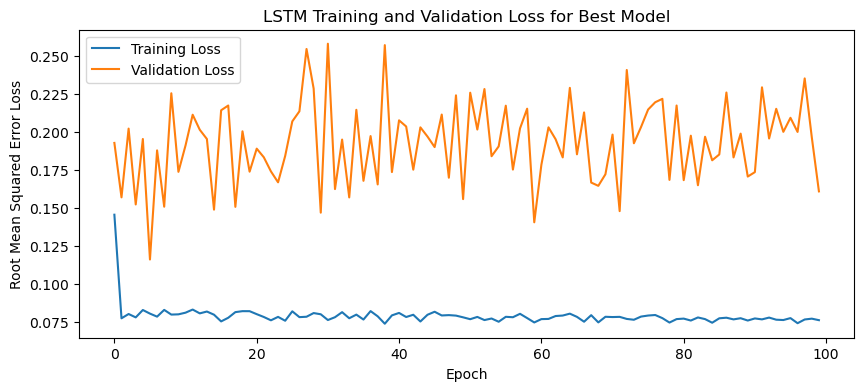

1/1 - 3s - loss: 0.0914 - 3s/epoch - 3s/step
Test Loss: 0.09143959730863571
1/1 [==============================] - 0s 51ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

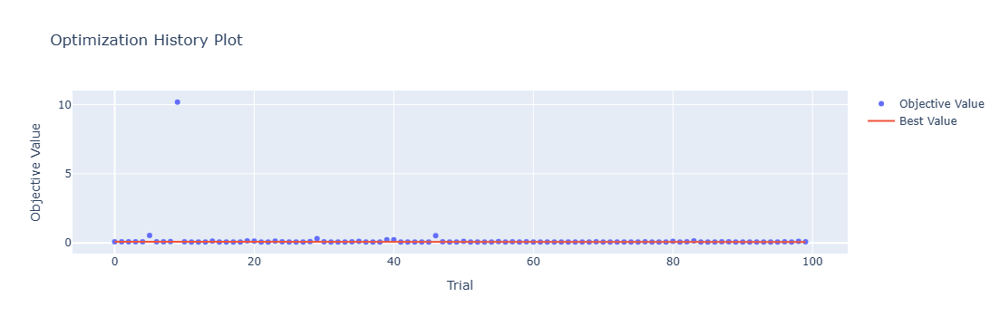

In [4]:
optuna.visualization.plot_optimization_history(study)

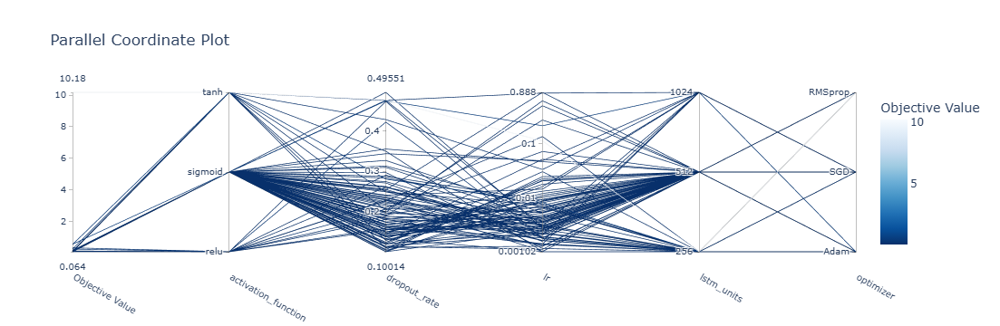

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

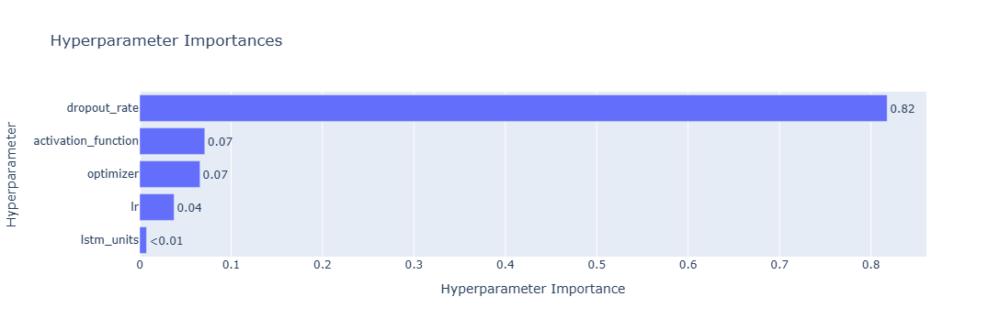

In [6]:
optuna.visualization.plot_param_importances(study)

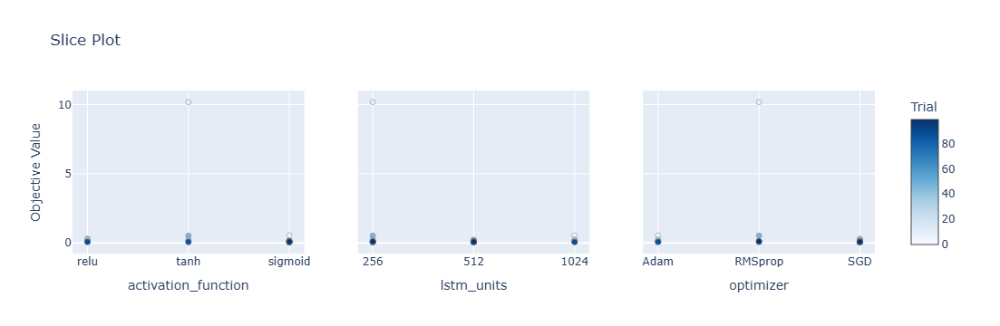

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

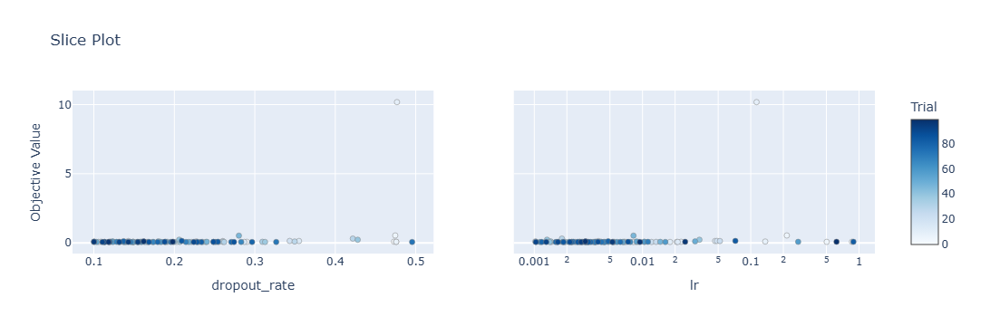

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 19s 74ms/step - loss: 0.1089 - accuracy: 0.6905 - mae: 0.0914 - rmse: 0.1089 - mape: 15.9681 - pearson: 0.7353 - val_loss: 0.0755 - val_accuracy: 0.6000 - val_mae: 0.0620 - val_rmse: 0.0755 - val_mape: 11.2262 - val_pearson: 0.7698
Epoch 2/100
84/84 [==============================] - 2s 29ms/step - loss: 0.0828 - accuracy: 0.6786 - mae: 0.0673 - rmse: 0.0828 - mape: 11.9389 - pearson: 0.7295 - val_loss: 0.0688 - val_accuracy: 0.6000 - val_mae: 0.0563 - val_rmse: 0.0688 - val_mape: 10.1310 - val_pearson: 0.8050
Epoch 3/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0753 - accuracy: 0.6905 - mae: 0.0595 - rmse: 0.0753 - mape: 10.4990 - pearson: 0.7452 - val_loss: 0.0980 - val_accuracy: 0.6000 - val_mae: 0.0806 - val_rmse: 0.0980 - val_mape: 14.3331 - val_pearson: 0.7925
Epoch 4/100
84/84 [==============================] - 2s 25ms/step - loss: 0.0791 - accuracy: 0.7024 - mae: 0.0630 - rmse: 0.0791 - mape: 11.0673 - 

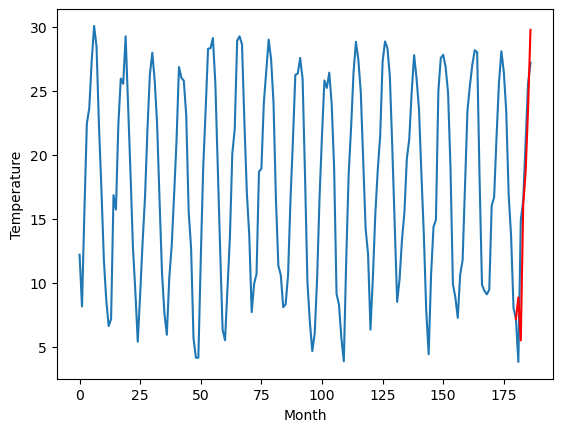

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		7.89		-0.64
8.44		4.55		-3.89
13.50		15.10		1.60
14.90		17.69		2.79
18.92		22.58		3.66
22.40		28.76		6.36
[180, 181, 182, 183, 184, 185, 186]
[13.23, 7.888328854814172, 4.548938338533044, 15.095707480683924, 17.68950397230685, 22.576725785508753, 28.758245770707727]


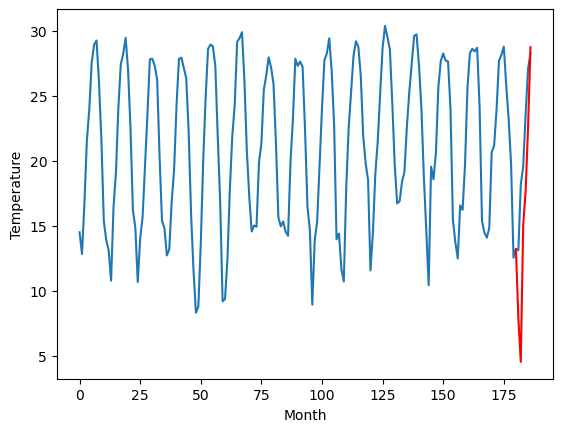

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		6.50		-0.81
8.17		3.17		-5.00
14.15		13.71		-0.44
15.79		16.31		0.52
19.77		21.20		1.43
23.91		27.37		3.46
[180, 181, 182, 183, 184, 185, 186]
[7.18, 6.501841871775687, 3.1674922395125034, 13.710921614207328, 16.31107172254473, 21.195509283579888, 27.373472063578667]


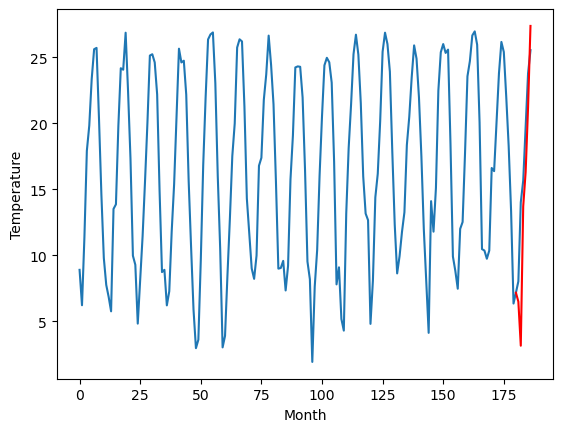

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		5.31		-0.07
3.81		1.96		-1.85
11.72		12.52		0.80
13.51		15.11		1.60
17.48		19.99		2.51
20.76		26.16		5.40
[180, 181, 182, 183, 184, 185, 186]
[11.46, 5.314705955758691, 1.9640692351013422, 12.515602934136986, 15.111879694238304, 19.987149584069847, 26.157844412103294]


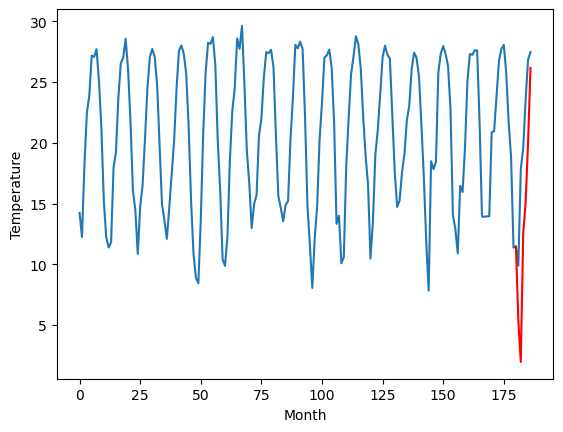

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		12.24		0.91
8.24		8.87		0.63
18.14		19.44		1.30
20.07		22.03		1.96
23.93		26.91		2.98
29.13		33.09		3.96
[180, 181, 182, 183, 184, 185, 186]
[9.27, 12.239038460925222, 8.87124919243157, 19.437279694750906, 22.034445279315115, 26.910610192492605, 33.08813332863152]


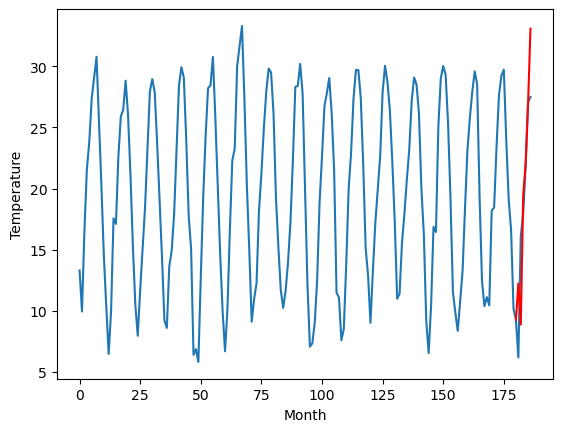

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		14.54		1.80
13.39		11.19		-2.20
18.29		21.72		3.43
21.66		24.32		2.66
25.17		29.20		4.03
29.74		35.37		5.63
[180, 181, 182, 183, 184, 185, 186]
[7.77, 14.538075734376907, 11.188455392122268, 21.722474862337112, 24.32274847149849, 29.19863681912422, 35.36699276089668]


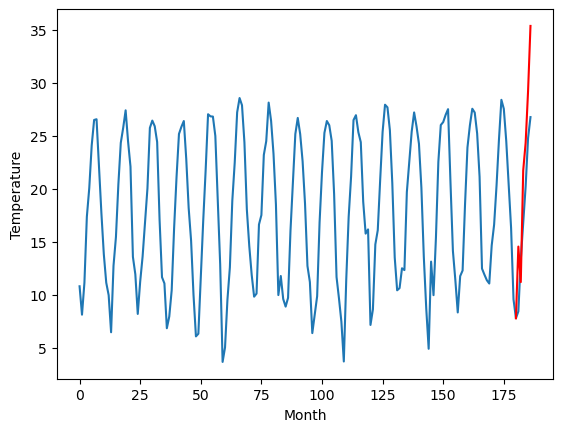

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		8.92		0.59
8.97		5.57		-3.40
15.95		16.10		0.15
16.98		18.70		1.72
20.69		23.58		2.89
25.02		29.75		4.73
[180, 181, 182, 183, 184, 185, 186]
[6.59, 8.916269266363233, 5.573709928747267, 16.102372610326857, 18.703409635778517, 23.576287710424513, 29.74864622330293]


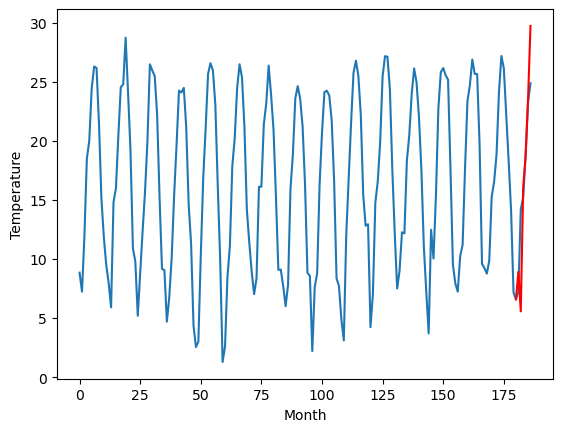

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		14.23		0.94
13.91		10.89		-3.02
20.43		21.41		0.98
24.06		24.01		-0.05
27.08		28.88		1.80
31.87		35.05		3.18
[180, 181, 182, 183, 184, 185, 186]
[5.3, 14.2303493547556, 10.888414912235458, 21.410557322513778, 24.010795645725448, 28.879121832859237, 35.054074339878284]


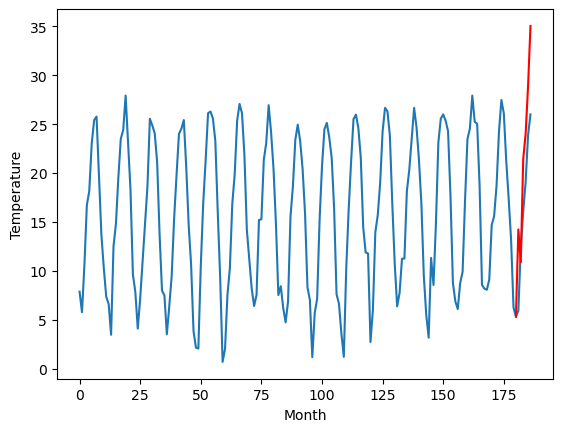

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		13.30		0.79
8.24		9.94		1.70
20.71		20.49		-0.22
23.31		23.08		-0.23
28.00		27.94		-0.06
34.19		34.14		-0.05
[180, 181, 182, 183, 184, 185, 186]
[3.1, 13.303382892580704, 9.943312902422623, 20.487366933794693, 23.07530047413893, 27.9390566539485, 34.13556220051832]


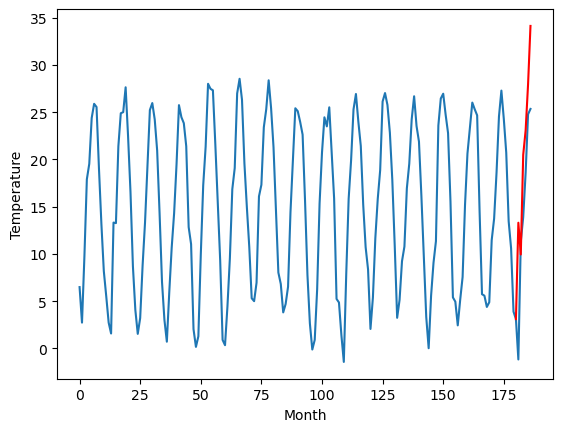

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		10.78		1.58
7.03		7.43		0.40
17.78		17.96		0.18
20.84		20.55		-0.29
25.31		25.41		0.10
31.79		31.61		-0.18
[180, 181, 182, 183, 184, 185, 186]
[0.6, 10.782777283303439, 7.425658438317477, 17.959075186364352, 20.54606697332114, 25.41122982274741, 31.611928198449313]


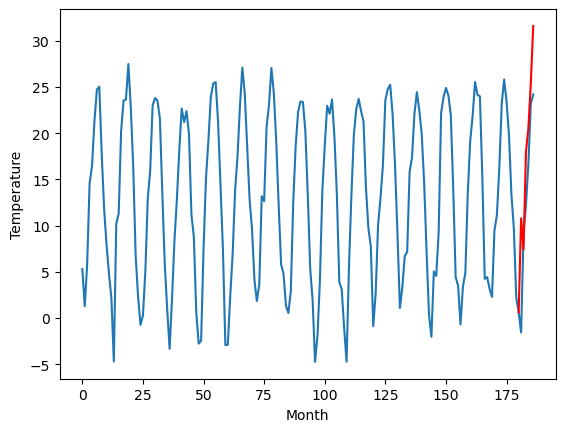

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		8.84		1.60
2.93		5.48		2.55
14.66		16.01		1.35
18.63		18.60		-0.03
23.78		23.46		-0.32
31.09		29.67		-1.42
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 8.84128994718194, 5.475142190605402, 16.01231069341302, 18.598998258262874, 23.459463784843685, 29.667328069359066]


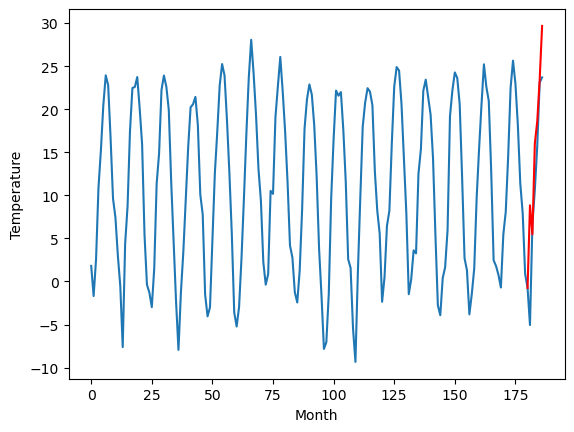

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[8.872274808958172, 7.888328854814172, 6.501841871775687, 5.314705955758691, 12.239038460925222, 14.538075734376907, 8.916269266363233, 14.2303493547556, 13.303382892580704, 10.782777283303439, 8.84128994718194]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   8.872275
1                 1    8.53   7.888329
2                 2    7.31   6.501842
3                 3    5.38   5.314706
4                 4   11.33  12.239038
5                 5   12.74  14.538076
6                 6    8.33   8.916269
7                 7   13.29  14.230349
8                 8   12.51  13.303383
9                 9    9.20  10.782777
10               10    7.24   8.841290


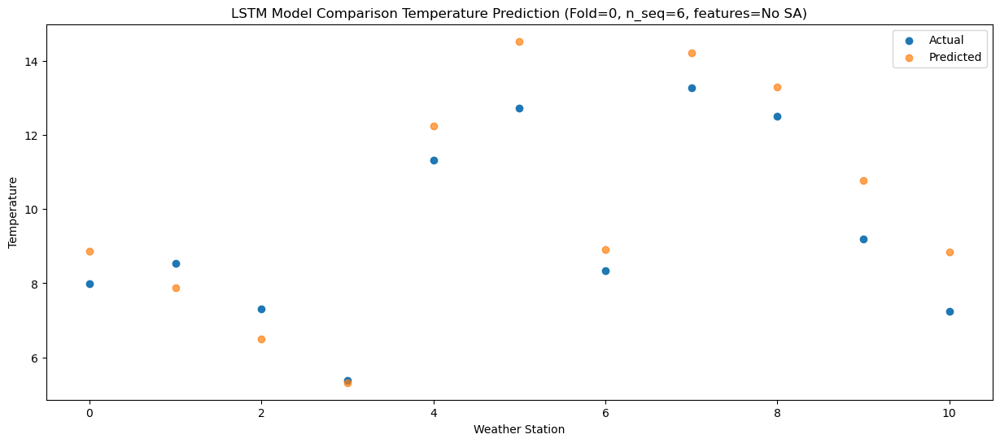

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   5.519858
1                 1    8.44   4.548938
2                 2    8.17   3.167492
3                 3    3.81   1.964069
4                 4    8.24   8.871249
5                 5   13.39  11.188455
6                 6    8.97   5.573710
7                 7   13.91  10.888415
8                 8    8.24   9.943313
9                 9    7.03   7.425658
10               10    2.93   5.475142


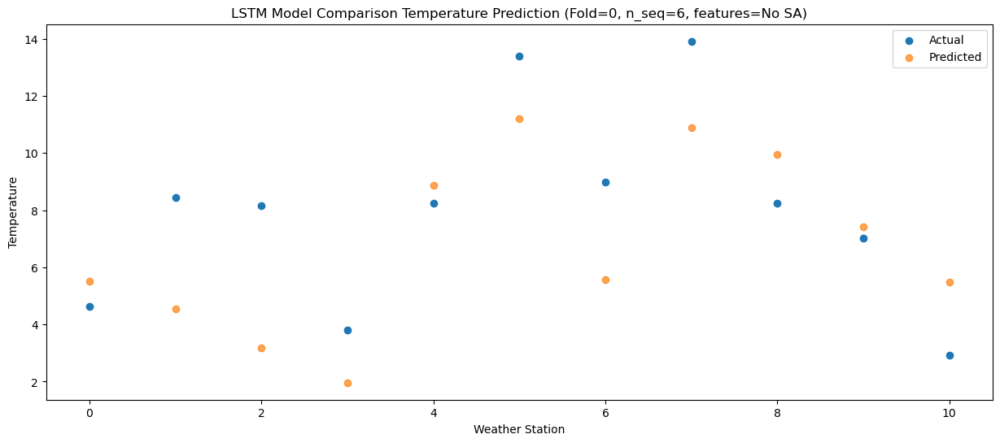

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  16.090382
1                 1   13.50  15.095707
2                 2   14.15  13.710922
3                 3   11.72  12.515603
4                 4   18.14  19.437280
5                 5   18.29  21.722475
6                 6   15.95  16.102373
7                 7   20.43  21.410557
8                 8   20.71  20.487367
9                 9   17.78  17.959075
10               10   14.66  16.012311


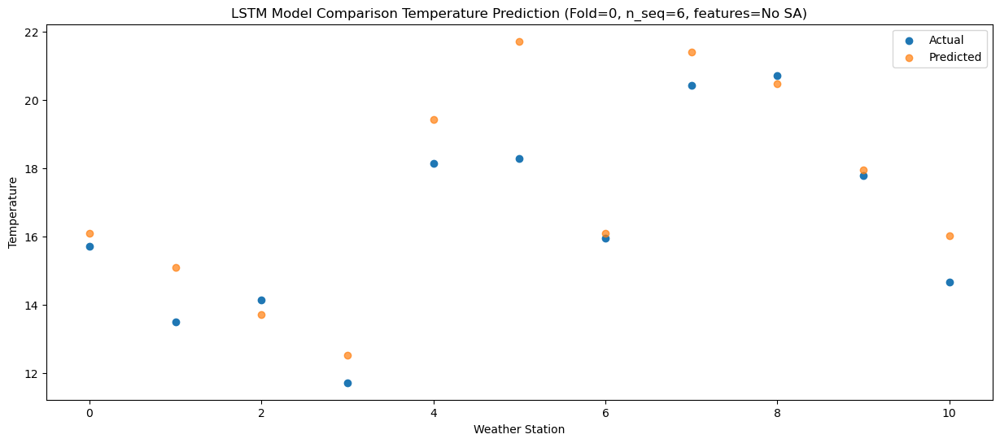

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.24  18.692266
1                 1   14.90  17.689504
2                 2   15.79  16.311072
3                 3   13.51  15.111880
4                 4   20.07  22.034445
5                 5   21.66  24.322748
6                 6   16.98  18.703410
7                 7   24.06  24.010796
8                 8   23.31  23.075300
9                 9   20.84  20.546067
10               10   18.63  18.598998


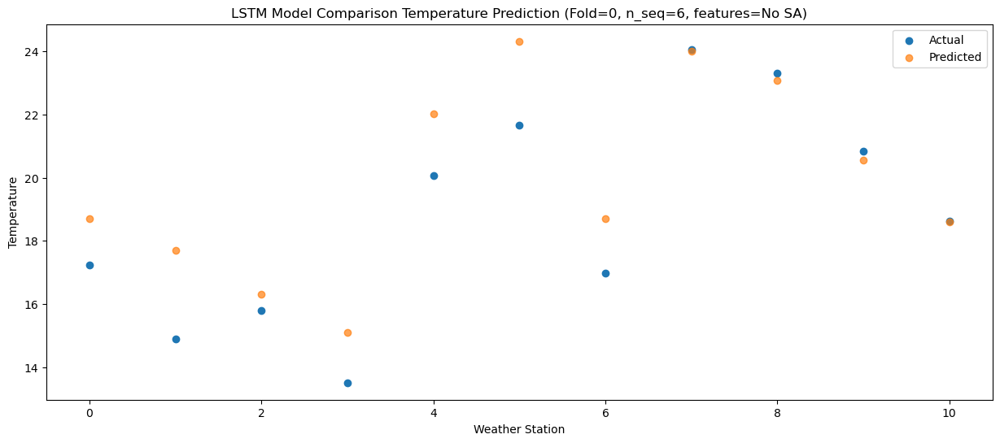

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.74  23.576245
1                 1   18.92  22.576726
2                 2   19.77  21.195509
3                 3   17.48  19.987150
4                 4   23.93  26.910610
5                 5   25.17  29.198637
6                 6   20.69  23.576288
7                 7   27.08  28.879122
8                 8   28.00  27.939057
9                 9   25.31  25.411230
10               10   23.78  23.459464


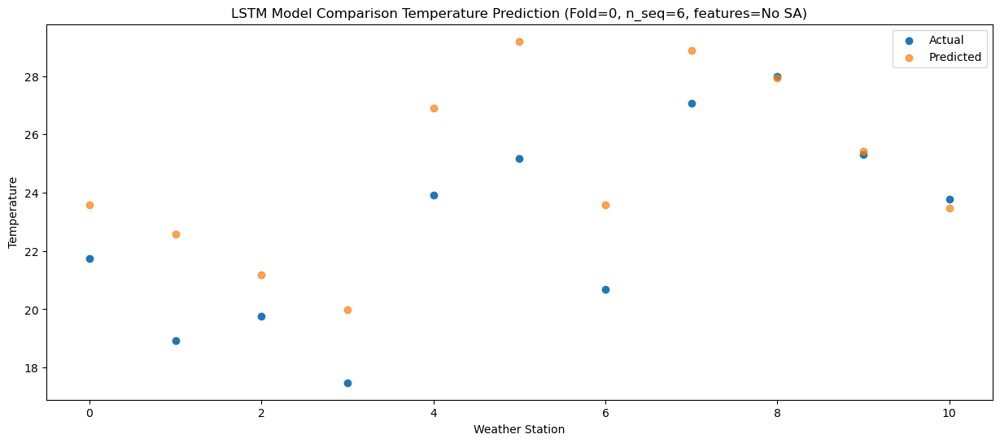

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.41  29.770888
1                 1   22.40  28.758246
2                 2   23.91  27.373472
3                 3   20.76  26.157844
4                 4   29.13  33.088133
5                 5   29.74  35.366993
6                 6   25.02  29.748646
7                 7   31.87  35.054074
8                 8   34.19  34.135562
9                 9   31.79  31.611928
10               10   31.09  29.667328


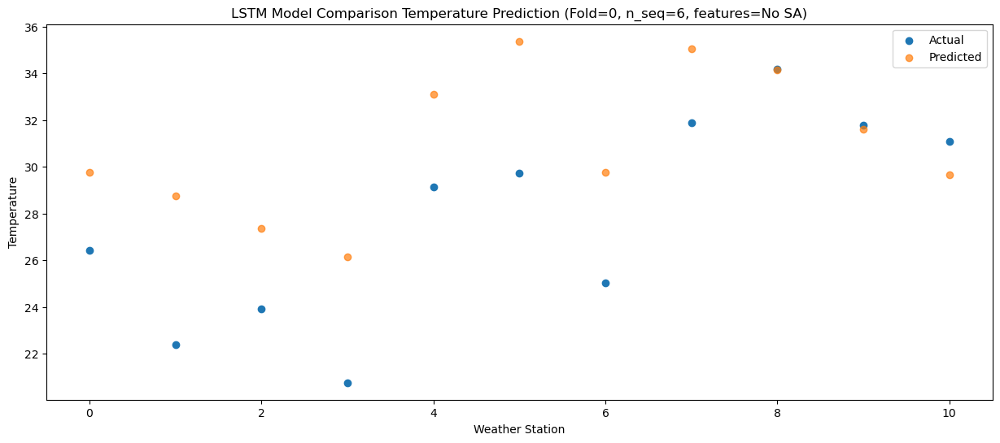

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 512)               5083136   
                                                                 
 dropout_1006 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1007 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1007 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 6)                 

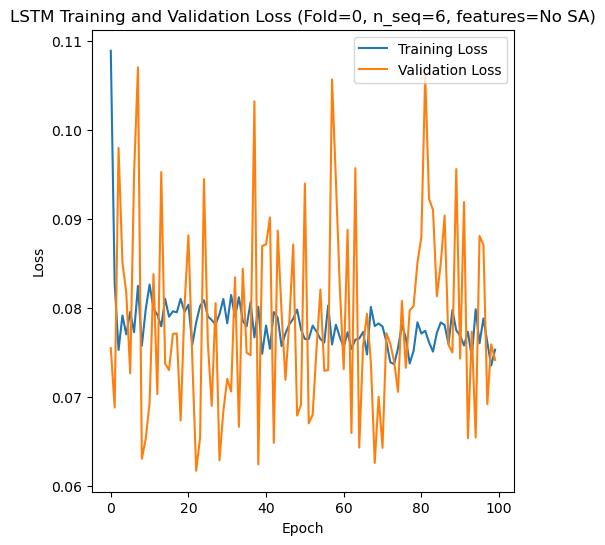

Epoch 1/100
84/84 [==============================] - 36s 172ms/step - loss: 0.1849 - accuracy: 0.5595 - mae: 0.1454 - rmse: 0.1849 - mape: 23.2004 - pearson: 0.6814 - val_loss: 0.0685 - val_accuracy: 0.8000 - val_mae: 0.0531 - val_rmse: 0.0685 - val_mape: 9.5067 - val_pearson: 0.8310
Epoch 2/100
84/84 [==============================] - 8s 94ms/step - loss: 0.0808 - accuracy: 0.6429 - mae: 0.0646 - rmse: 0.0808 - mape: 11.4126 - pearson: 0.7454 - val_loss: 0.0766 - val_accuracy: 0.8000 - val_mae: 0.0574 - val_rmse: 0.0766 - val_mape: 9.8811 - val_pearson: 0.8215
Epoch 3/100
84/84 [==============================] - 8s 99ms/step - loss: 0.0784 - accuracy: 0.6429 - mae: 0.0627 - rmse: 0.0784 - mape: 10.9697 - pearson: 0.7355 - val_loss: 0.0822 - val_accuracy: 0.8000 - val_mae: 0.0640 - val_rmse: 0.0822 - val_mape: 11.7382 - val_pearson: 0.8216
Epoch 4/100
84/84 [==============================] - 9s 108ms/step - loss: 0.0763 - accuracy: 0.6786 - mae: 0.0604 - rmse: 0.0763 - mape: 10.5230 - 

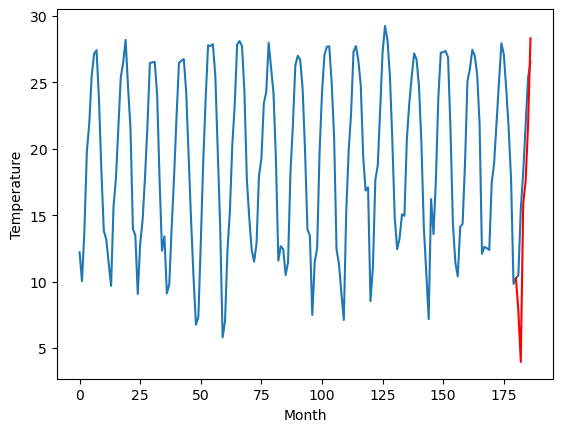

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.67		6.81		-0.86
8.33		2.96		-5.37
15.10		14.87		-0.23
17.24		16.60		-0.64
20.97		20.76		-0.21
25.11		27.34		2.23
[180, 181, 182, 183, 184, 185, 186]
[6.41, 6.811874504089356, 2.9550956439971925, 14.874404306411744, 16.596961851119996, 20.764384145736695, 27.34475790977478]


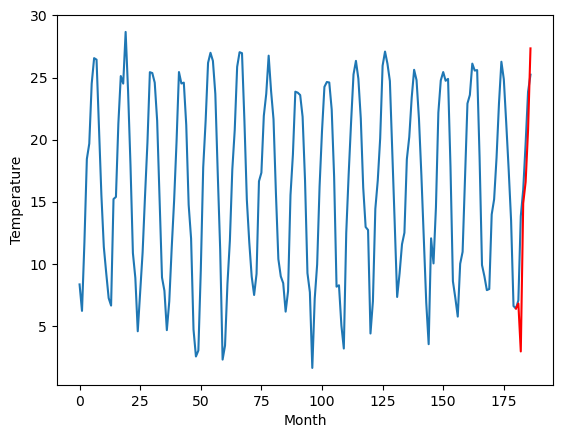

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.91		5.43		-1.48
7.40		1.58		-5.82
14.46		13.49		-0.97
15.86		15.22		-0.64
19.98		19.38		-0.60
23.86		25.96		2.10
[180, 181, 182, 183, 184, 185, 186]
[7.6, 5.430273880958557, 1.5779114866256716, 13.49368583202362, 15.218988766670227, 19.38061510562897, 25.961272587776186]


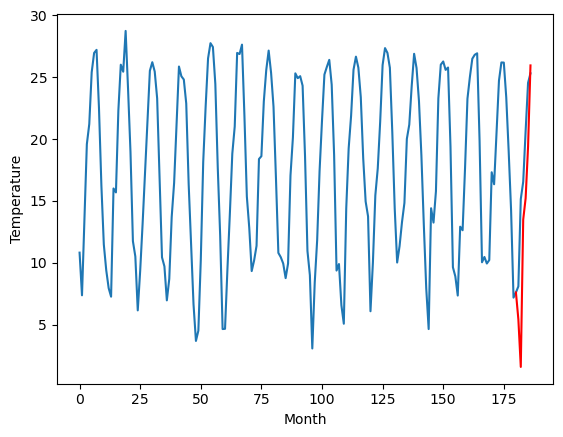

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.19		4.24		-0.95
3.60		0.39		-3.21
10.97		12.30		1.33
13.31		14.04		0.73
17.20		18.21		1.01
21.09		24.79		3.70
[180, 181, 182, 183, 184, 185, 186]
[11.89, 4.240397491455078, 0.3923948192596436, 12.299970426559447, 14.043602862358092, 18.20533887386322, 24.788162627220153]


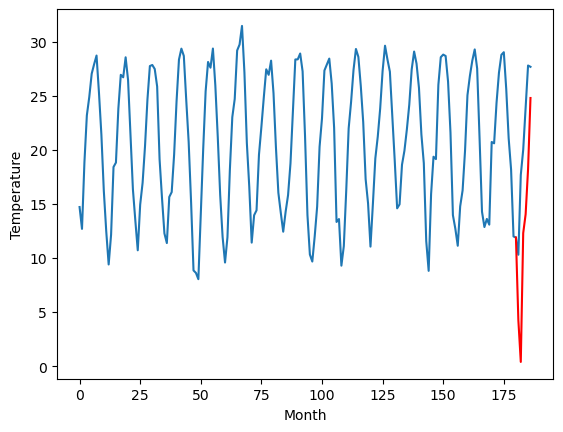

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.20		11.17		-1.03
10.50		7.32		-3.18
18.11		19.22		1.11
20.41		20.96		0.55
24.53		25.13		0.60
28.00		31.71		3.71
[180, 181, 182, 183, 184, 185, 186]
[10.96, 11.167381367683411, 7.3177791452407845, 19.2209144449234, 20.964987239837647, 25.12690731048584, 31.714402160644532]


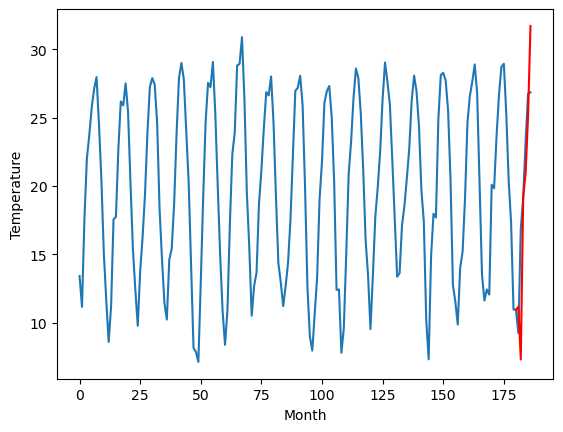

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.01		13.48		0.47
13.39		9.61		-3.78
20.73		21.51		0.78
23.00		23.25		0.25
28.59		27.42		-1.17
32.86		34.00		1.14
[180, 181, 182, 183, 184, 185, 186]
[7.75, 13.475793380737304, 9.614478607177734, 21.511100311279296, 23.25350191116333, 27.415002841949462, 34.00173856735229]


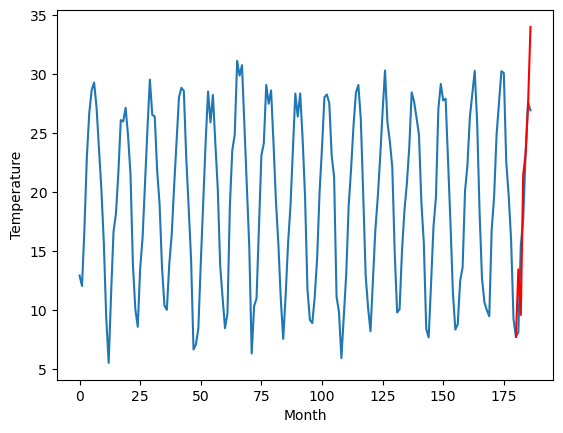

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.71		7.86		-0.85
9.49		4.01		-5.48
15.77		15.92		0.15
18.34		17.64		-0.70
22.11		21.81		-0.30
26.12		28.39		2.27
[180, 181, 182, 183, 184, 185, 186]
[6.17, 7.861358199119568, 4.009662184715271, 15.915380988121033, 17.642454895973206, 21.807486329078674, 28.388764176368714]


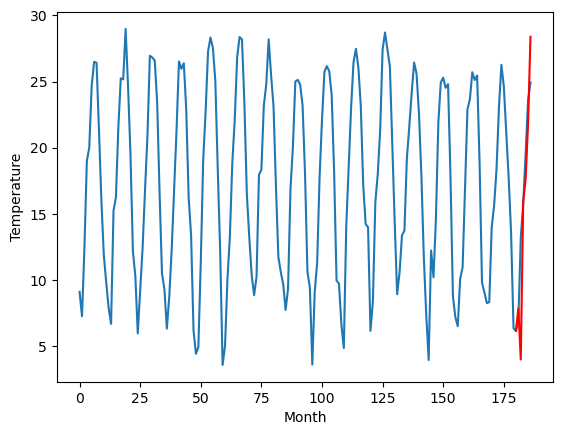

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.92		13.16		-0.76
10.92		9.31		-1.61
22.24		21.23		-1.01
23.95		22.95		-1.00
28.61		27.11		-1.50
34.69		33.69		-1.00
[180, 181, 182, 183, 184, 185, 186]
[4.57, 13.16261194229126, 9.310184936523438, 21.22545478820801, 22.949988703727723, 27.109924178123475, 33.68563113689423]


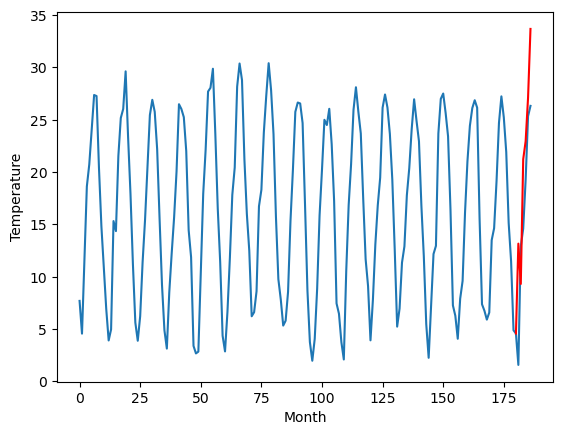

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.95		12.24		-0.71
8.17		8.38		0.21
20.73		20.29		-0.44
22.53		22.02		-0.51
27.34		26.18		-1.16
33.37		32.75		-0.62
[180, 181, 182, 183, 184, 185, 186]
[5.46, 12.239001917839051, 8.375318217277528, 20.288052248954774, 22.023106026649476, 26.17913763523102, 32.74872772693634]


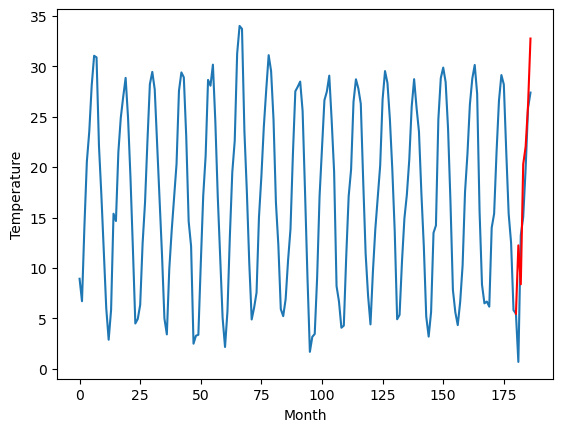

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.90		9.73		-1.17
6.53		5.86		-0.67
17.24		17.77		0.53
21.00		19.51		-1.49
25.55		23.67		-1.88
32.66		30.25		-2.41
[180, 181, 182, 183, 184, 185, 186]
[5.42, 9.726638116836547, 5.859701194763183, 17.771327056884765, 19.51412395477295, 23.674920597076415, 30.25144151687622]


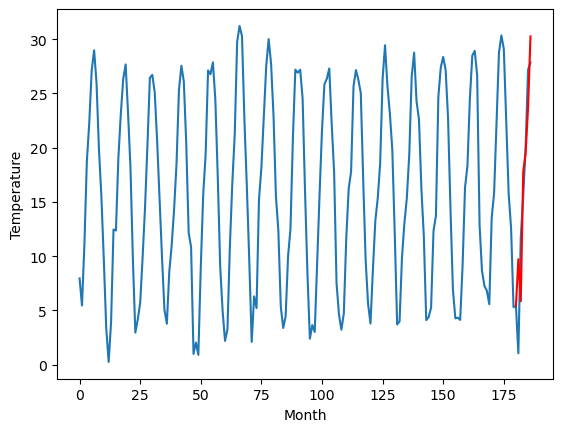

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.01		7.78		0.77
6.05		3.92		-2.13
13.27		15.85		2.58
17.92		17.58		-0.34
22.46		21.76		-0.70
28.55		28.33		-0.22
[180, 181, 182, 183, 184, 185, 186]
[2.17, 7.78230664730072, 3.923079705238342, 15.846992707252502, 17.583878016471864, 21.75673863887787, 28.331768488883974]


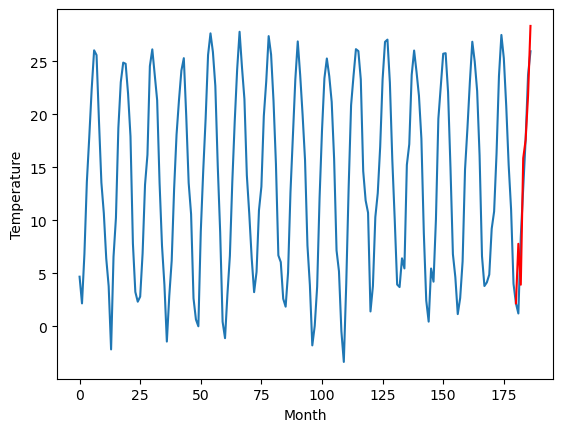

RangeIndex(start=1, stop=12, step=1)
[9.27, 7.669999999999999, 6.91, 5.1899999999999995, 12.2, 13.01, 8.709999999999999, 13.92, 12.950000000000001, 10.9, 7.01]
[7.806760048866272, 6.811874504089356, 5.430273880958557, 4.240397491455078, 11.167381367683411, 13.475793380737304, 7.861358199119568, 13.16261194229126, 12.239001917839051, 9.726638116836547, 7.78230664730072]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.27   7.806760
1                 1    7.67   6.811875
2                 2    6.91   5.430274
3                 3    5.19   4.240397
4                 4   12.20  11.167381
5                 5   13.01  13.475793
6                 6    8.71   7.861358
7                 7   13.92  13.162612
8                 8   12.95  12.239002
9                 9   10.90   9.726638
10               10    7.01   7.782307


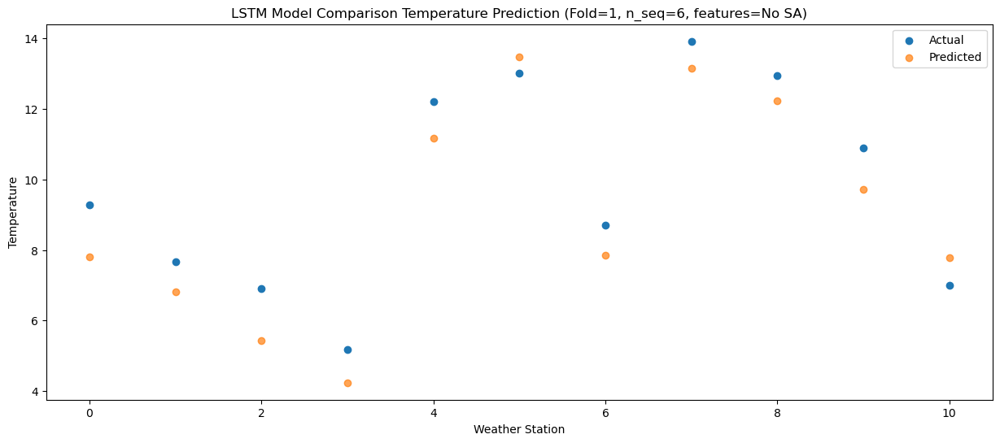

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.49   3.941165
1                 1    8.33   2.955096
2                 2    7.40   1.577911
3                 3    3.60   0.392395
4                 4   10.50   7.317779
5                 5   13.39   9.614479
6                 6    9.49   4.009662
7                 7   10.92   9.310185
8                 8    8.17   8.375318
9                 9    6.53   5.859701
10               10    6.05   3.923080


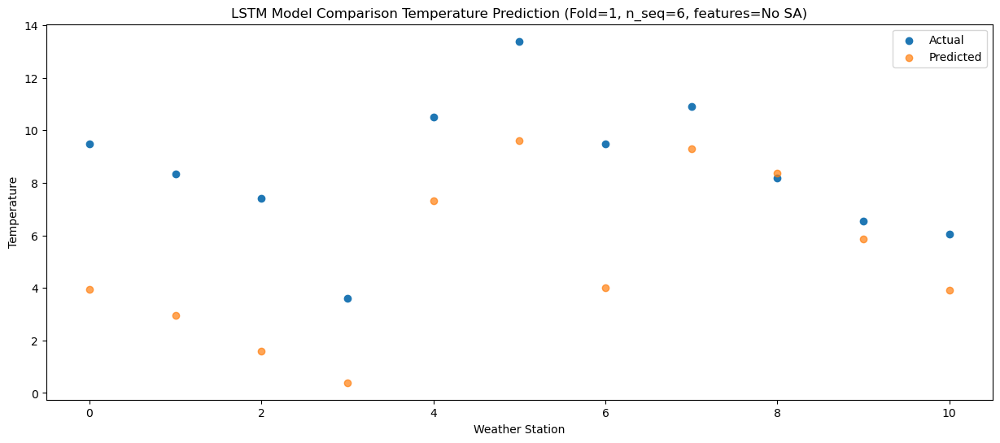

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.47  15.859620
1                 1   15.10  14.874404
2                 2   14.46  13.493686
3                 3   10.97  12.299970
4                 4   18.11  19.220914
5                 5   20.73  21.511100
6                 6   15.77  15.915381
7                 7   22.24  21.225455
8                 8   20.73  20.288052
9                 9   17.24  17.771327
10               10   13.27  15.846993


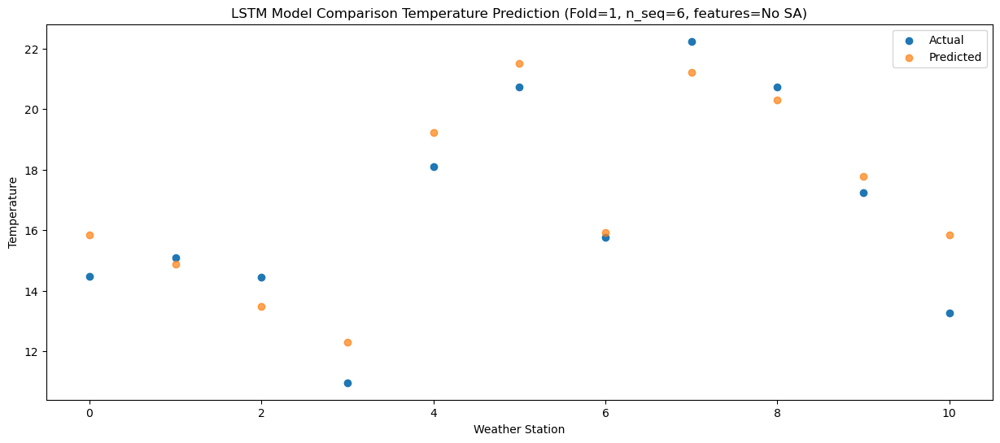

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.28  17.582093
1                 1   17.24  16.596962
2                 2   15.86  15.218989
3                 3   13.31  14.043603
4                 4   20.41  20.964987
5                 5   23.00  23.253502
6                 6   18.34  17.642455
7                 7   23.95  22.949989
8                 8   22.53  22.023106
9                 9   21.00  19.514124
10               10   17.92  17.583878


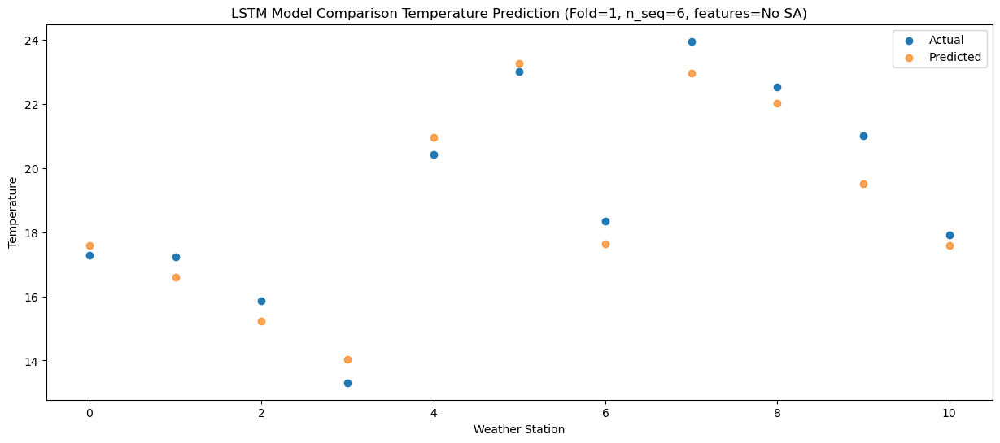

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.89  21.753590
1                 1   20.97  20.764384
2                 2   19.98  19.380615
3                 3   17.20  18.205339
4                 4   24.53  25.126907
5                 5   28.59  27.415003
6                 6   22.11  21.807486
7                 7   28.61  27.109924
8                 8   27.34  26.179138
9                 9   25.55  23.674921
10               10   22.46  21.756739


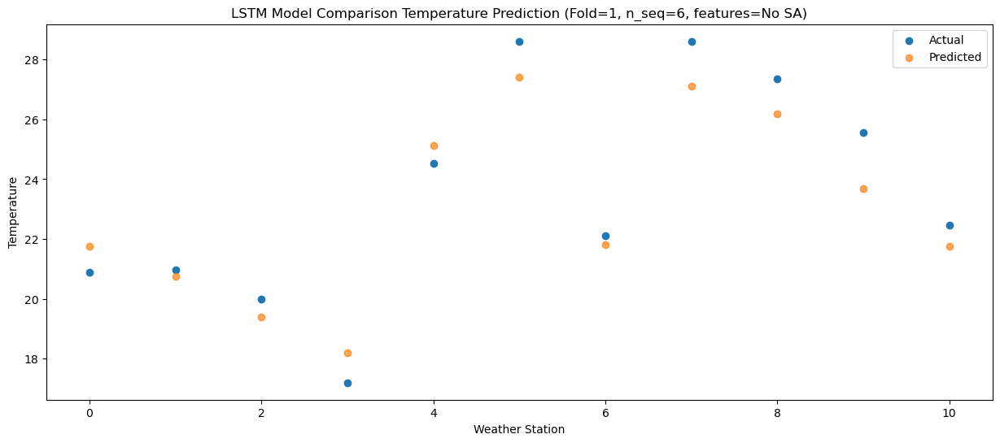

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   24.38  28.328435
1                 1   25.11  27.344758
2                 2   23.86  25.961273
3                 3   21.09  24.788163
4                 4   28.00  31.714402
5                 5   32.86  34.001739
6                 6   26.12  28.388764
7                 7   34.69  33.685631
8                 8   33.37  32.748728
9                 9   32.66  30.251442
10               10   28.55  28.331768


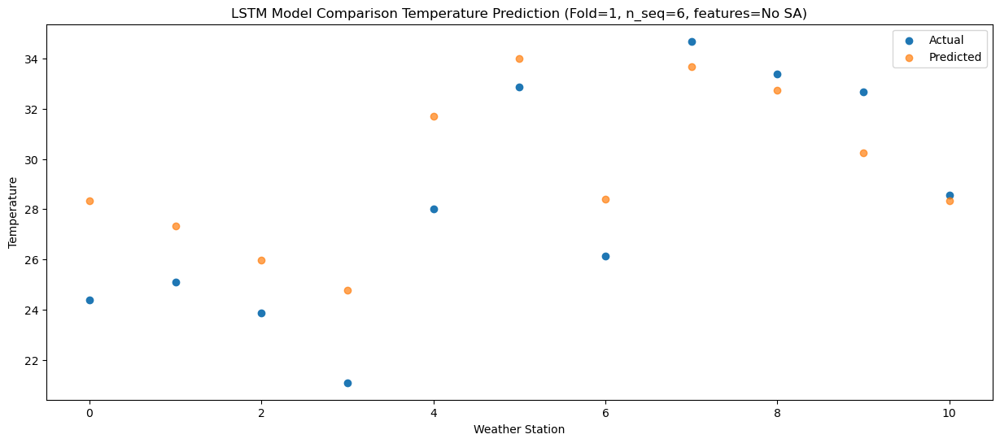

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 512)               5083136   
                                                                 
 dropout_1008 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1009 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1009 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 6)                 

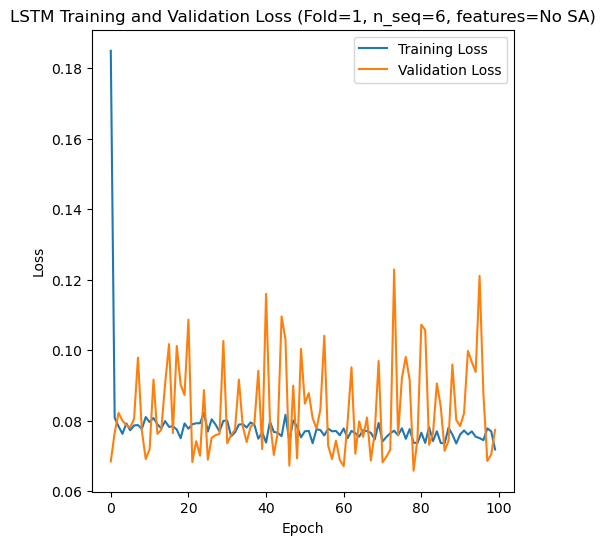

Epoch 1/100
84/84 [==============================] - 35s 172ms/step - loss: 0.1215 - accuracy: 0.6071 - mae: 0.1037 - rmse: 0.1215 - mape: 18.0294 - pearson: 0.6740 - val_loss: 0.0588 - val_accuracy: 0.9000 - val_mae: 0.0463 - val_rmse: 0.0588 - val_mape: 7.9582 - val_pearson: 0.9323
Epoch 2/100
84/84 [==============================] - 8s 101ms/step - loss: 0.0812 - accuracy: 0.6429 - mae: 0.0650 - rmse: 0.0812 - mape: 11.4705 - pearson: 0.7512 - val_loss: 0.0537 - val_accuracy: 0.9000 - val_mae: 0.0450 - val_rmse: 0.0537 - val_mape: 7.5270 - val_pearson: 0.9141
Epoch 3/100
84/84 [==============================] - 9s 103ms/step - loss: 0.0750 - accuracy: 0.6905 - mae: 0.0602 - rmse: 0.0750 - mape: 10.5113 - pearson: 0.7495 - val_loss: 0.1037 - val_accuracy: 0.9000 - val_mae: 0.0839 - val_rmse: 0.1037 - val_mape: 14.8544 - val_pearson: 0.8765
Epoch 4/100
84/84 [==============================] - 8s 94ms/step - loss: 0.0752 - accuracy: 0.6786 - mae: 0.0614 - rmse: 0.0752 - mape: 10.8128 -

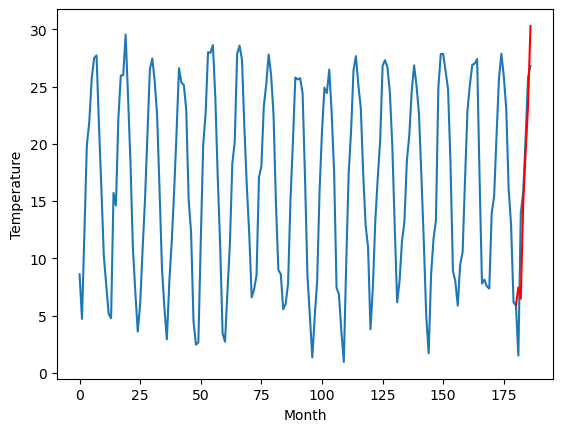

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.79		6.49		-1.30
3.75		5.50		1.75
13.94		13.87		-0.07
17.70		18.22		0.52
22.88		22.38		-0.50
30.13		29.32		-0.81
[180, 181, 182, 183, 184, 185, 186]
[2.63, 6.490400667190552, 5.495324785709381, 13.869677240848542, 18.22408741235733, 22.380742723941804, 29.31928365945816]


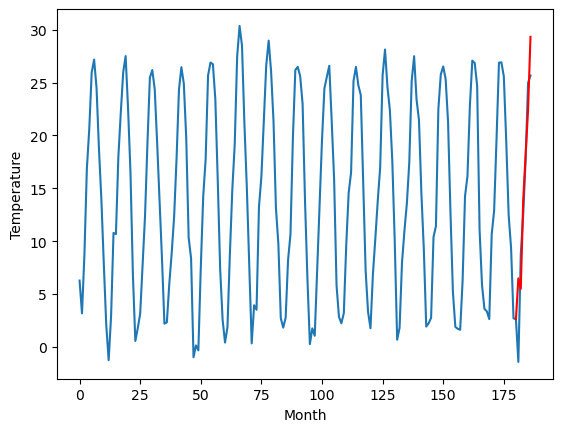

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.15		5.12		-2.03
9.88		4.15		-5.73
11.69		12.51		0.82
13.50		16.86		3.36
17.08		21.01		3.93
18.30		27.94		9.64
[180, 181, 182, 183, 184, 185, 186]
[16.55, 5.1228870058059695, 4.148661305904389, 12.506758382320404, 16.86038177251816, 21.00592916250229, 27.943345715999605]


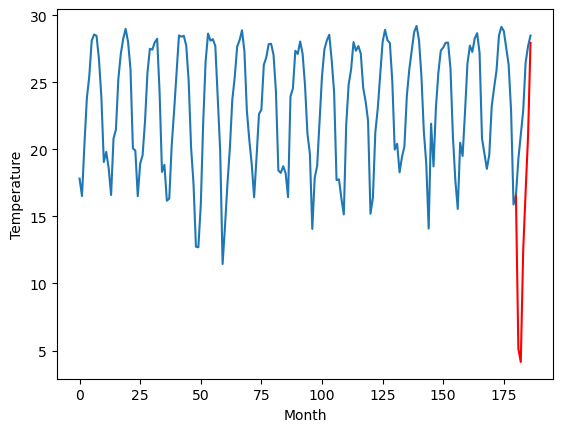

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.21		3.91		1.70
2.23		2.92		0.69
6.34		11.29		4.95
10.84		15.66		4.82
16.10		19.82		3.72
21.67		26.75		5.08
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 3.9088828945159912, 2.92440865278244, 11.29110787153244, 15.65782282590866, 19.816626765727996, 26.75054857969284]


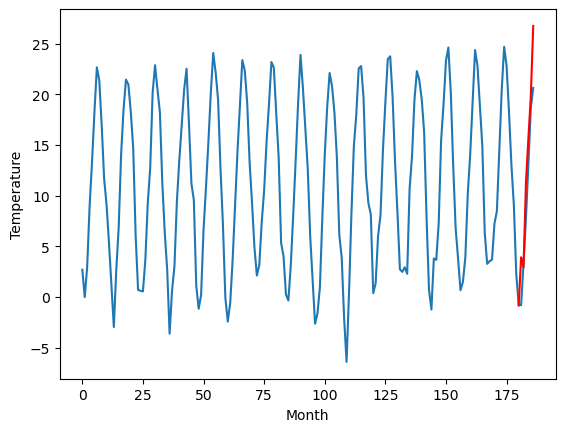

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.56		10.84		-1.72
11.82		9.87		-1.95
19.15		18.23		-0.92
20.02		22.58		2.56
24.49		26.73		2.24
27.97		33.66		5.69
[180, 181, 182, 183, 184, 185, 186]
[11.52, 10.840775690078736, 9.871494672298432, 18.226444623470307, 22.582240006923676, 26.734960935115815, 33.66027297735214]


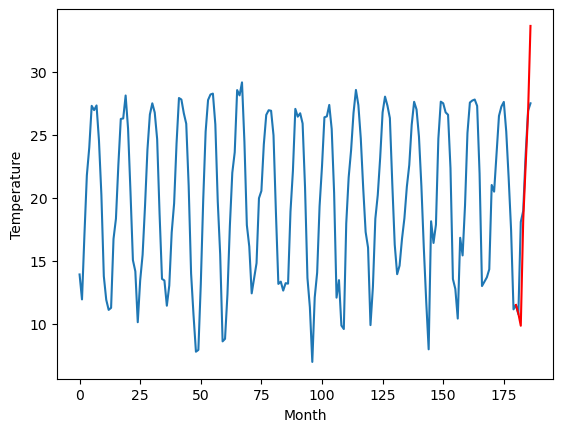

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.93		13.15		-0.78
11.58		12.17		0.59
19.96		20.53		0.57
22.08		24.88		2.80
26.12		29.04		2.92
30.67		35.96		5.29
[180, 181, 182, 183, 184, 185, 186]
[11.47, 13.149276633262634, 12.172810096740722, 20.52900650024414, 24.880108375549316, 29.03832342147827, 35.96240283966064]


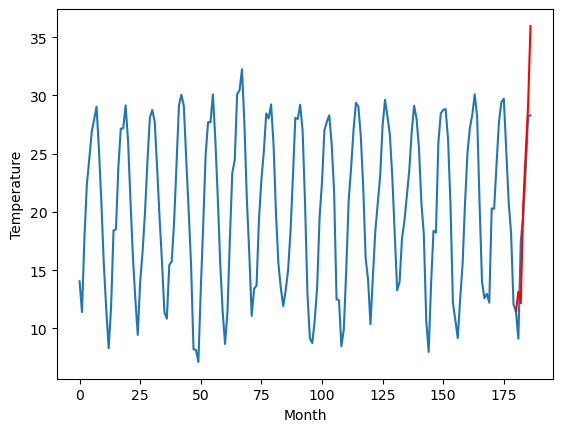

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.21		7.54		-0.67
5.10		6.56		1.46
15.47		14.93		-0.54
17.17		19.29		2.12
21.25		23.45		2.20
26.81		30.37		3.56
[180, 181, 182, 183, 184, 185, 186]
[7.75, 7.541693005561829, 6.563555691242218, 14.931412670612335, 19.28932139635086, 23.447116825580597, 30.37217566728592]


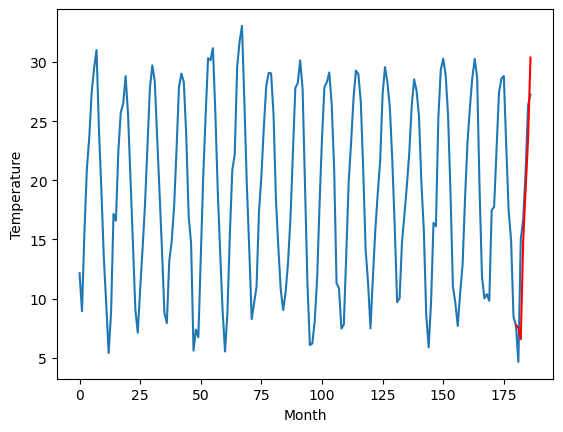

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.77		12.87		-1.90
17.69		11.91		-5.78
20.79		20.26		-0.53
27.45		24.61		-2.84
32.46		28.77		-3.69
37.45		35.69		-1.76
[180, 181, 182, 183, 184, 185, 186]
[4.9, 12.871125321388245, 11.909753839969635, 20.261048357486725, 24.61175016641617, 28.76964763879776, 35.69333891153336]


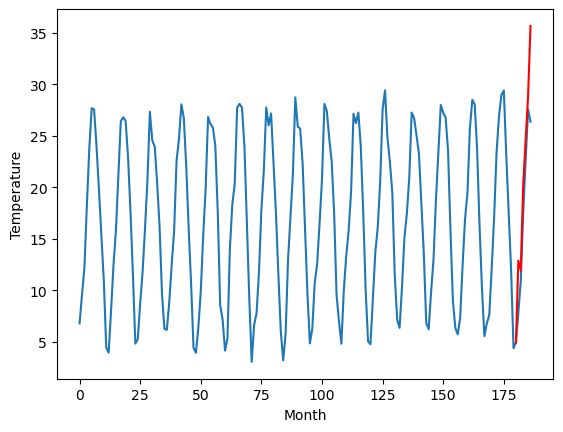

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.24		11.93		-1.31
12.32		10.96		-1.36
11.92		19.32		7.40
15.78		23.67		7.89
18.00		27.82		9.82
22.24		34.75		12.51
[180, 181, 182, 183, 184, 185, 186]
[14.14, 11.930209684371949, 10.961414325237275, 19.316254603862763, 23.67355297803879, 27.815075862407685, 34.74718474149704]


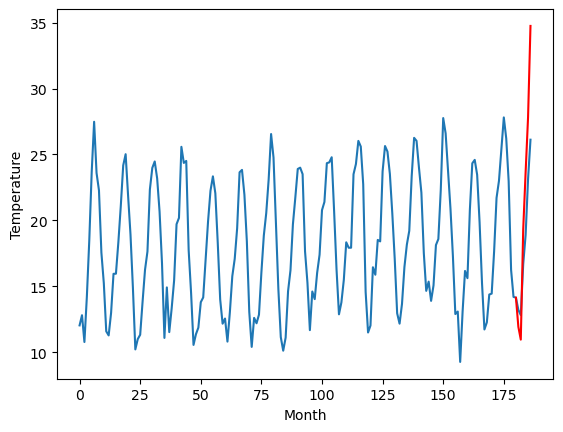

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.38		9.41		-0.97
10.88		8.45		-2.43
17.76		16.80		-0.96
20.55		21.15		0.60
24.57		25.29		0.72
28.86		32.22		3.36
[180, 181, 182, 183, 184, 185, 186]
[5.55, 9.411084451675414, 8.447090544700622, 16.798899092674255, 21.154945769309997, 25.29235593318939, 32.216331400871276]


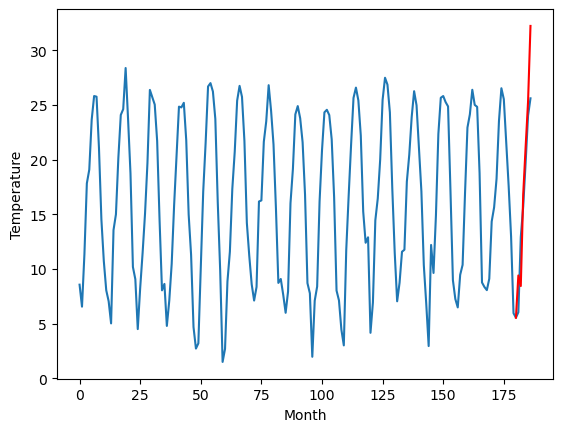

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.18		7.47		-1.71
10.53		6.51		-4.02
16.74		14.86		-1.88
18.71		19.22		0.51
23.62		23.36		-0.26
29.03		30.28		1.25
[180, 181, 182, 183, 184, 185, 186]
[3.19, 7.469771838188171, 6.5057004451751705, 14.85905680656433, 19.220891809463502, 23.361215925216676, 30.283223485946657]


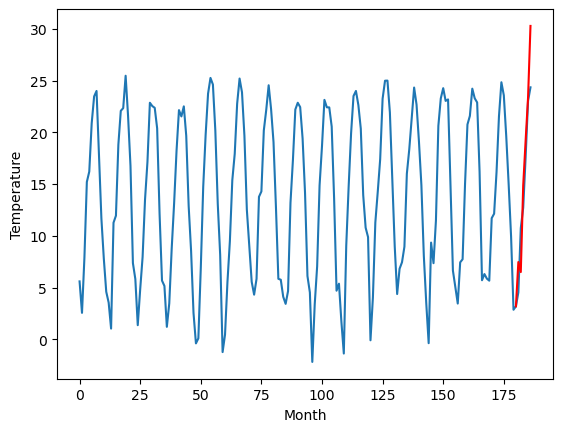

RangeIndex(start=1, stop=12, step=1)
[8.59, 7.790000000000001, 7.1499999999999995, 2.210000000000001, 12.560000000000002, 13.93, 8.21, 14.770000000000001, 13.240000000000004, 10.379999999999999, 9.18]
[7.465619778633117, 6.490400667190552, 5.1228870058059695, 3.9088828945159912, 10.840775690078736, 13.149276633262634, 7.541693005561829, 12.871125321388245, 11.930209684371949, 9.411084451675414, 7.469771838188171]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.59   7.465620
1                 1    7.79   6.490401
2                 2    7.15   5.122887
3                 3    2.21   3.908883
4                 4   12.56  10.840776
5                 5   13.93  13.149277
6                 6    8.21   7.541693
7                 7   14.77  12.871125
8                 8   13.24  11.930210
9                 9   10.38   9.411084
10               10    9.18   7.469772


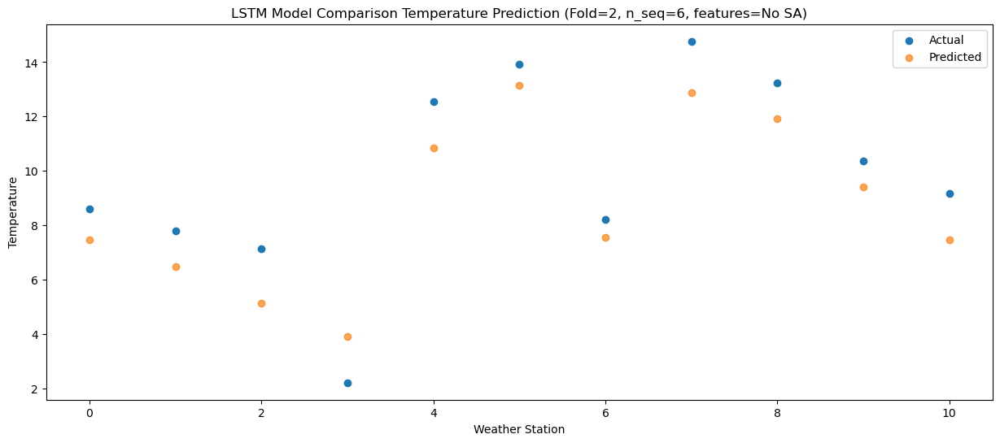

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.19   6.465244
1                 1    3.75   5.495325
2                 2    9.88   4.148661
3                 3    2.23   2.924409
4                 4   11.82   9.871495
5                 5   11.58  12.172810
6                 6    5.10   6.563556
7                 7   17.69  11.909754
8                 8   12.32  10.961414
9                 9   10.88   8.447091
10               10   10.53   6.505700


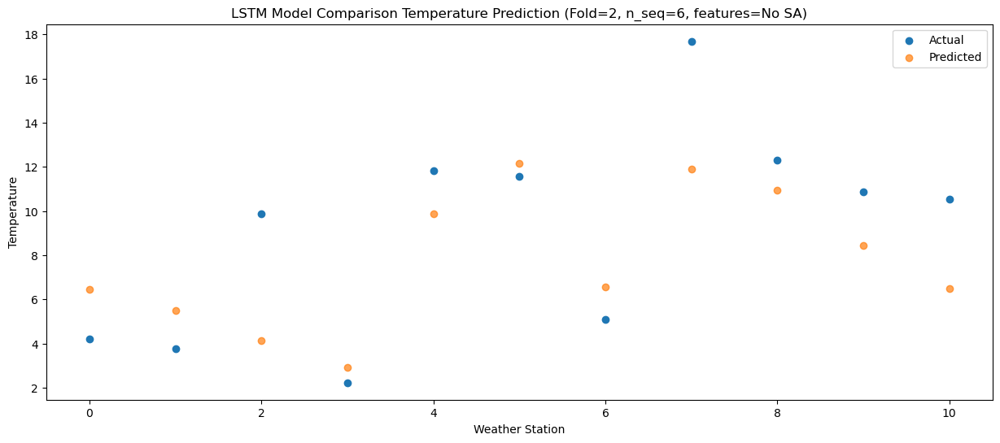

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.61  14.853114
1                 1   13.94  13.869677
2                 2   11.69  12.506758
3                 3    6.34  11.291108
4                 4   19.15  18.226445
5                 5   19.96  20.529007
6                 6   15.47  14.931413
7                 7   20.79  20.261048
8                 8   11.92  19.316255
9                 9   17.76  16.798899
10               10   16.74  14.859057


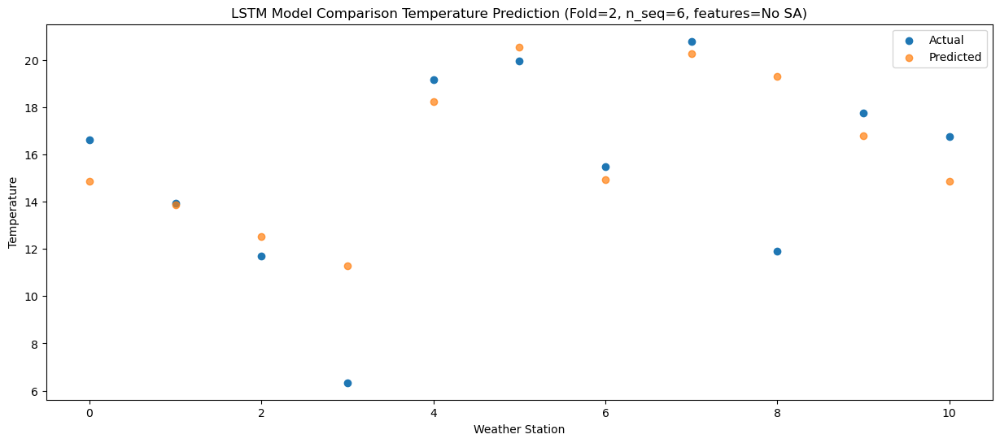

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.48  19.210304
1                 1   17.70  18.224087
2                 2   13.50  16.860382
3                 3   10.84  15.657823
4                 4   20.02  22.582240
5                 5   22.08  24.880108
6                 6   17.17  19.289321
7                 7   27.45  24.611750
8                 8   15.78  23.673553
9                 9   20.55  21.154946
10               10   18.71  19.220892


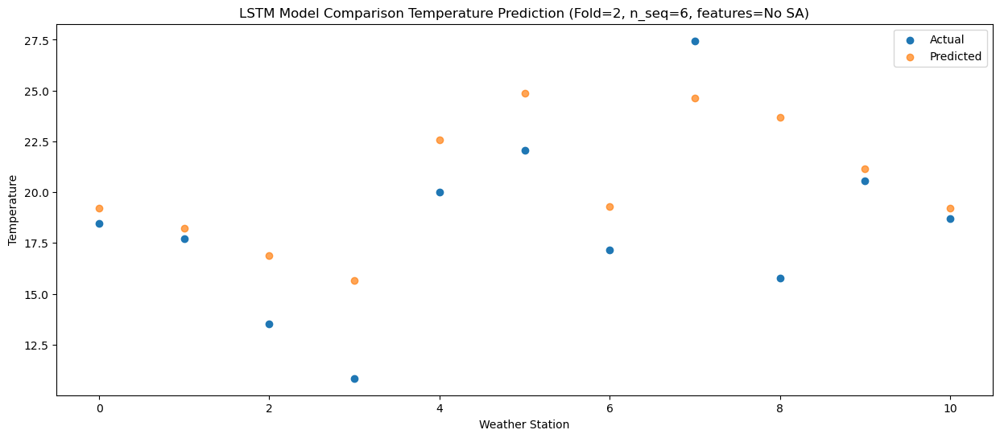

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.26  23.378201
1                 1   22.88  22.380743
2                 2   17.08  21.005929
3                 3   16.10  19.816627
4                 4   24.49  26.734961
5                 5   26.12  29.038323
6                 6   21.25  23.447117
7                 7   32.46  28.769648
8                 8   18.00  27.815076
9                 9   24.57  25.292356
10               10   23.62  23.361216


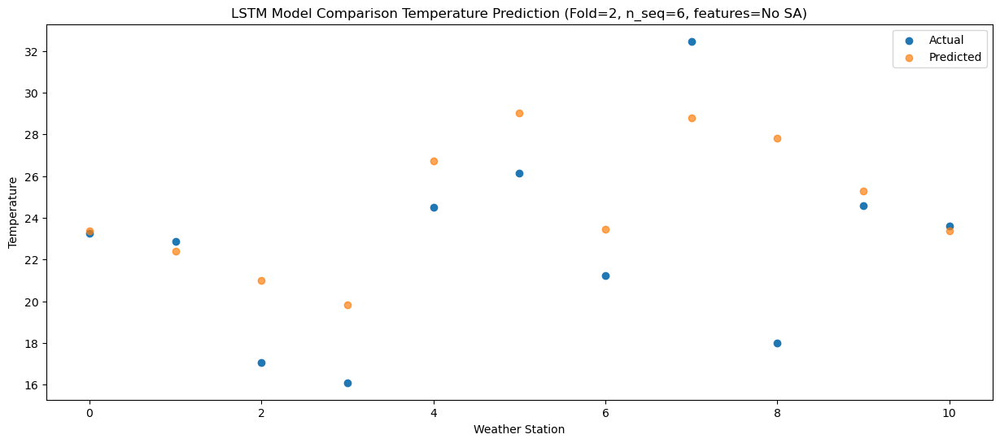

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.51  30.307999
1                 1   30.13  29.319284
2                 2   18.30  27.943346
3                 3   21.67  26.750549
4                 4   27.97  33.660273
5                 5   30.67  35.962403
6                 6   26.81  30.372176
7                 7   37.45  35.693339
8                 8   22.24  34.747185
9                 9   28.86  32.216331
10               10   29.03  30.283223


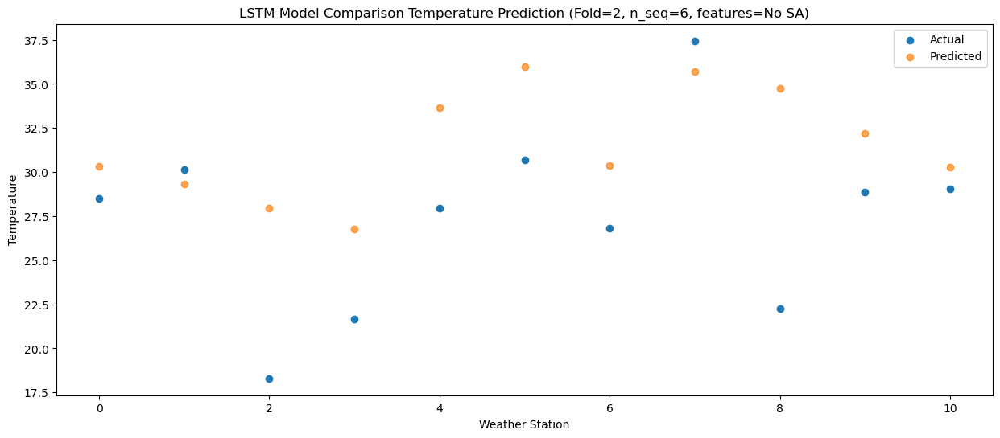

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1010 (LSTM)            (1, 1, 512)               5083136   
                                                                 
 dropout_1010 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1011 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1011 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1515 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1516 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1517 (Dense)          (1, 6)                 

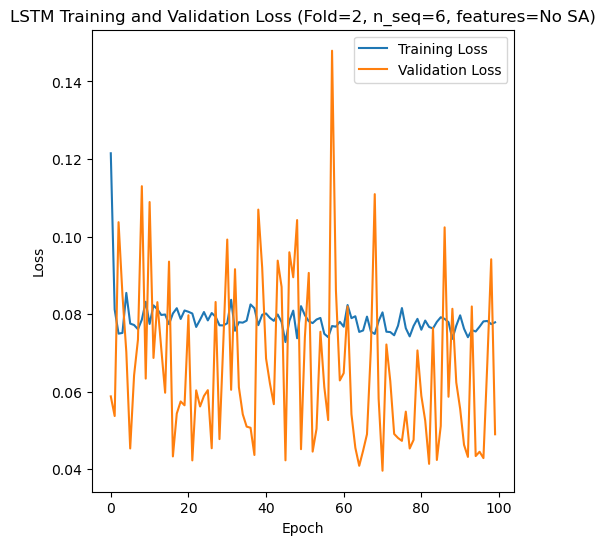

Epoch 1/100
84/84 [==============================] - 39s 170ms/step - loss: 0.1441 - accuracy: 0.6667 - mae: 0.1112 - rmse: 0.1441 - mape: 18.9134 - pearson: 0.7097 - val_loss: 0.1200 - val_accuracy: 0.1000 - val_mae: 0.0896 - val_rmse: 0.1200 - val_mape: 16.9771 - val_pearson: 0.4867
Epoch 2/100
84/84 [==============================] - 8s 92ms/step - loss: 0.0794 - accuracy: 0.7619 - mae: 0.0642 - rmse: 0.0794 - mape: 11.6080 - pearson: 0.7763 - val_loss: 0.0784 - val_accuracy: 0.1000 - val_mae: 0.0621 - val_rmse: 0.0784 - val_mape: 11.7388 - val_pearson: 0.7850
Epoch 3/100
84/84 [==============================] - 8s 94ms/step - loss: 0.0790 - accuracy: 0.7024 - mae: 0.0637 - rmse: 0.0790 - mape: 11.5373 - pearson: 0.7874 - val_loss: 0.0776 - val_accuracy: 0.7000 - val_mae: 0.0604 - val_rmse: 0.0776 - val_mape: 12.2697 - val_pearson: 0.7557
Epoch 4/100
84/84 [==============================] - 8s 95ms/step - loss: 0.0777 - accuracy: 0.7024 - mae: 0.0627 - rmse: 0.0777 - mape: 11.3790 -

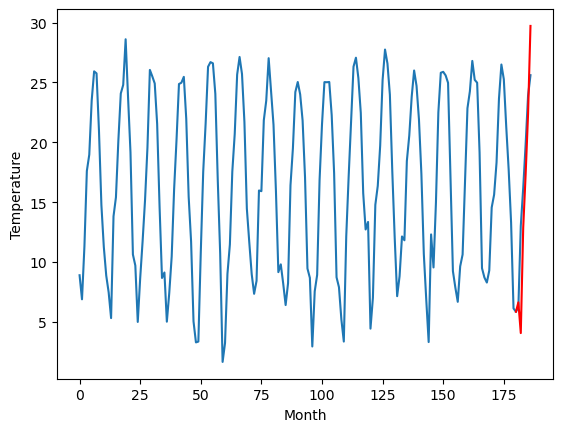

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.72		5.64		-1.08
3.00		3.08		0.08
14.97		11.90		-3.07
16.83		16.36		-0.47
21.05		21.39		0.34
27.76		28.76		1.00
[180, 181, 182, 183, 184, 185, 186]
[3.2, 5.641988868713379, 3.077277774810791, 11.897727603912355, 16.356620903015138, 21.390360946655274, 28.760255451202394]


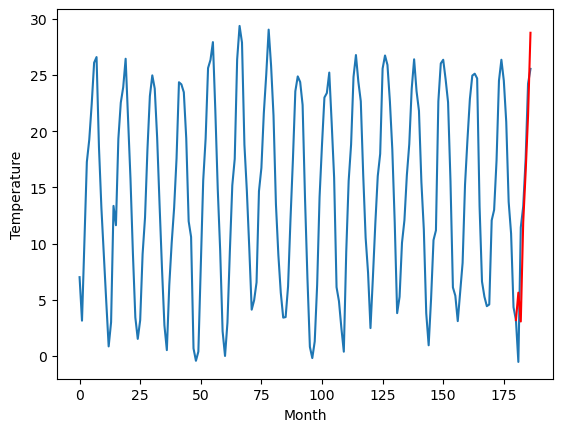

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		4.28		-3.47
10.05		1.71		-8.34
11.20		10.52		-0.68
16.93		14.99		-1.94
21.73		20.02		-1.71
26.58		27.41		0.83
[180, 181, 182, 183, 184, 185, 186]
[8.48, 4.2765185737609865, 1.714454164505005, 10.519329538345337, 14.987186422348023, 20.0235590839386, 27.407887926101687]


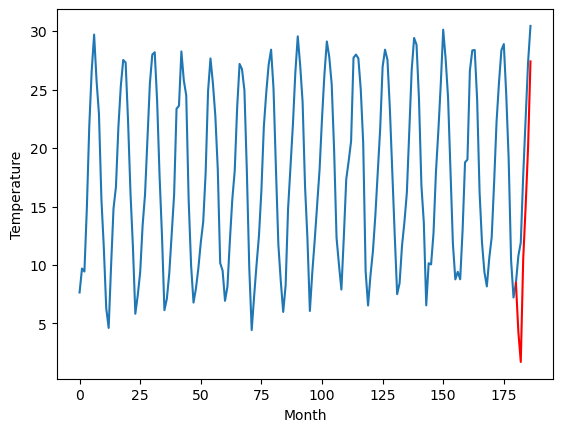

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.83		3.07		-0.76
2.51		0.50		-2.01
12.72		9.31		-3.41
15.07		13.77		-1.30
19.14		18.81		-0.33
25.06		26.18		1.12
[180, 181, 182, 183, 184, 185, 186]
[1.55, 3.06521014213562, 0.49619273185729984, 9.309057989120483, 13.770342149734496, 18.805814542770385, 26.183123388290404]


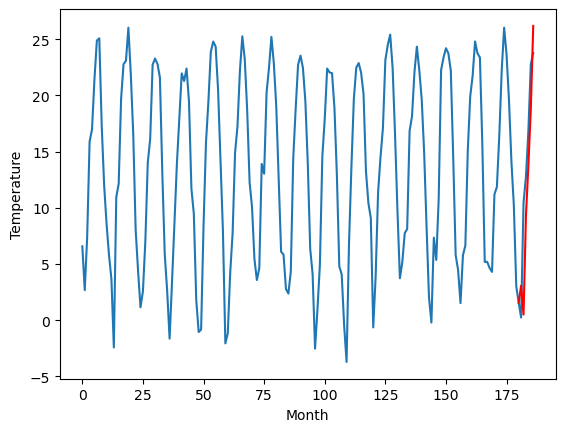

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.74		9.98		-0.76
6.87		7.42		0.55
19.95		16.24		-3.71
23.24		20.71		-2.53
27.81		25.74		-2.07
35.29		33.11		-2.18
[180, 181, 182, 183, 184, 185, 186]
[1.08, 9.982905111312867, 7.420248231887818, 16.24280758857727, 20.711617670059205, 25.740270338058473, 33.111740312576295]


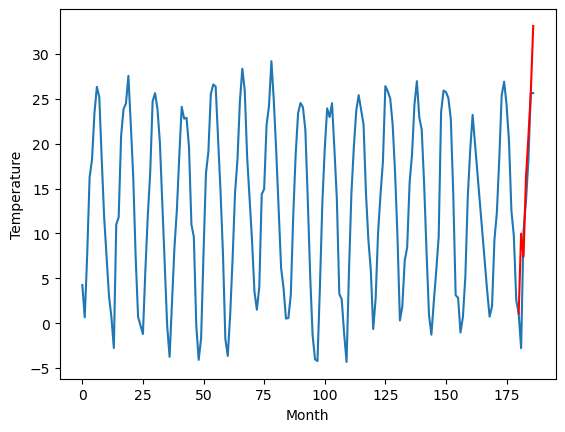

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		12.29		-0.78
10.35		9.72		-0.63
21.68		18.55		-3.13
25.13		23.02		-2.11
29.41		28.05		-1.36
36.12		35.43		-0.69
[180, 181, 182, 183, 184, 185, 186]
[0.21, 12.289185781478881, 9.723931331634521, 18.55443956375122, 23.01593687057495, 28.049403686523437, 35.42699529647827]


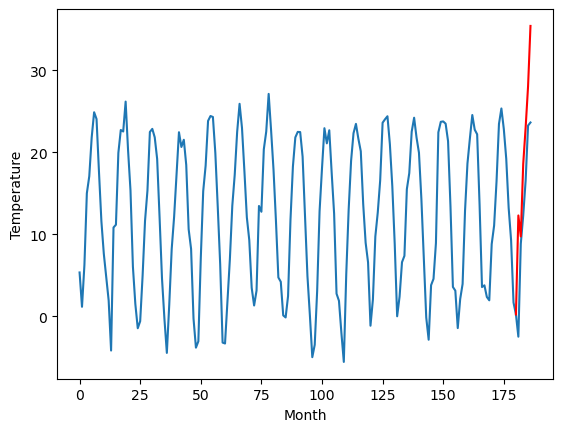

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.18		6.69		-2.49
9.28		4.12		-5.16
12.25		12.94		0.69
17.03		17.41		0.38
22.08		22.44		0.36
29.47		29.82		0.35
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 6.690505418777466, 4.124766979217529, 12.944326076507569, 17.407493743896485, 22.4378959274292, 29.817140731811524]


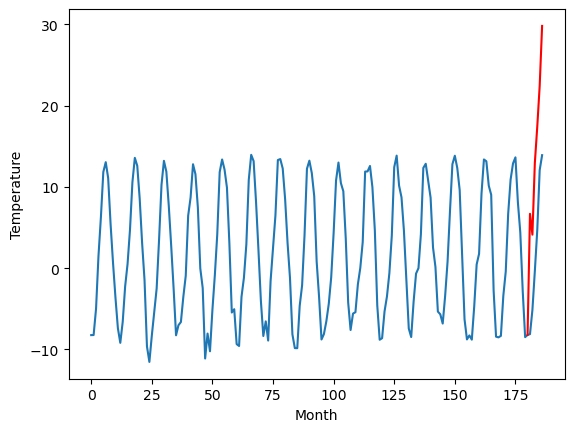

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.78		12.02		-2.76
17.63		9.45		-8.18
19.23		18.27		-0.96
27.20		22.73		-4.47
31.63		27.77		-3.86
39.27		35.16		-4.11
[180, 181, 182, 183, 184, 185, 186]
[10.04, 12.017720680236817, 9.453119974136353, 18.266094903945923, 22.733657579421997, 27.766880731582642, 35.15901635169983]


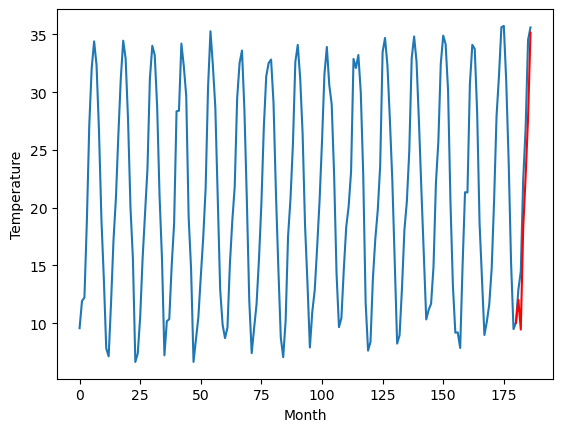

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.52		11.10		-3.42
15.45		8.53		-6.92
15.23		17.34		2.11
17.42		21.81		4.39
21.71		26.84		5.13
23.41		34.23		10.82
[180, 181, 182, 183, 184, 185, 186]
[9.17, 11.097346591949464, 8.532114791870118, 17.343519973754884, 21.808178234100343, 26.84229974746704, 34.23068361282348]


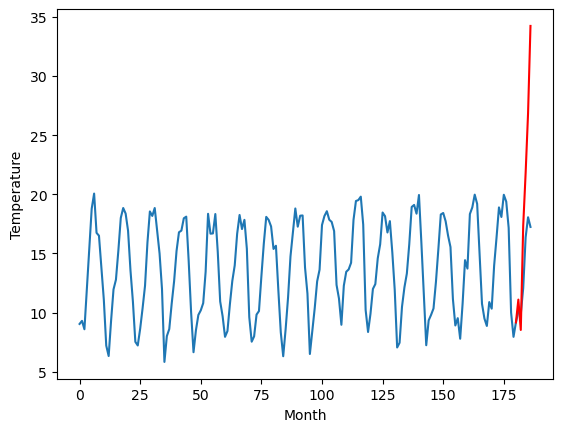

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.77		8.57		0.80
7.65		5.99		-1.66
12.65		14.79		2.14
17.27		19.26		1.99
22.10		24.30		2.20
27.97		31.68		3.71
[180, 181, 182, 183, 184, 185, 186]
[0.94, 8.57171396255493, 5.993771591186523, 14.790041961669921, 19.260204830169677, 24.295749225616454, 31.681202449798583]


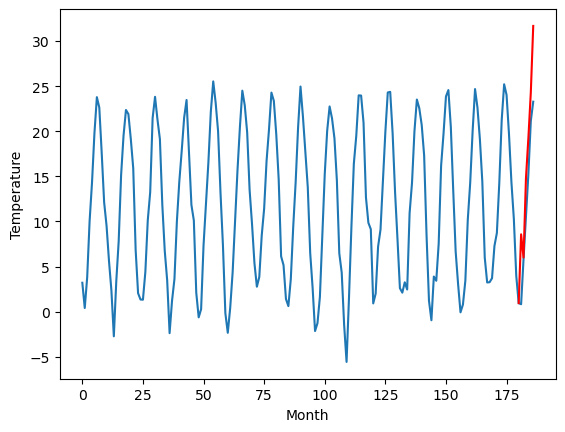

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.29		6.62		-0.67
6.49		4.05		-2.44
13.68		12.84		-0.84
18.55		17.31		-1.24
22.81		22.35		-0.46
28.98		29.73		0.75
[180, 181, 182, 183, 184, 185, 186]
[-0.13, 6.622905111312866, 4.046603775024414, 12.839200592041015, 17.31092224121094, 22.346947765350343, 29.729972457885744]


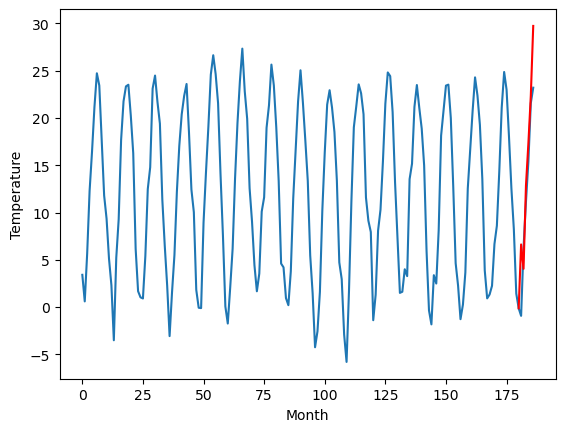

RangeIndex(start=1, stop=12, step=1)
[8.569999999999999, 6.720000000000001, 7.75, 3.8299999999999996, 10.74, 13.069999999999999, 9.18, 14.78, 14.520000000000001, 7.769999999999999, 7.29]
[6.63329062461853, 5.641988868713379, 4.2765185737609865, 3.06521014213562, 9.982905111312867, 12.289185781478881, 6.690505418777466, 12.017720680236817, 11.097346591949464, 8.57171396255493, 6.622905111312866]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.57   6.633291
1                 1    6.72   5.641989
2                 2    7.75   4.276519
3                 3    3.83   3.065210
4                 4   10.74   9.982905
5                 5   13.07  12.289186
6                 6    9.18   6.690505
7                 7   14.78  12.017721
8                 8   14.52  11.097347
9                 9    7.77   8.571714
10               10    7.29   6.622905


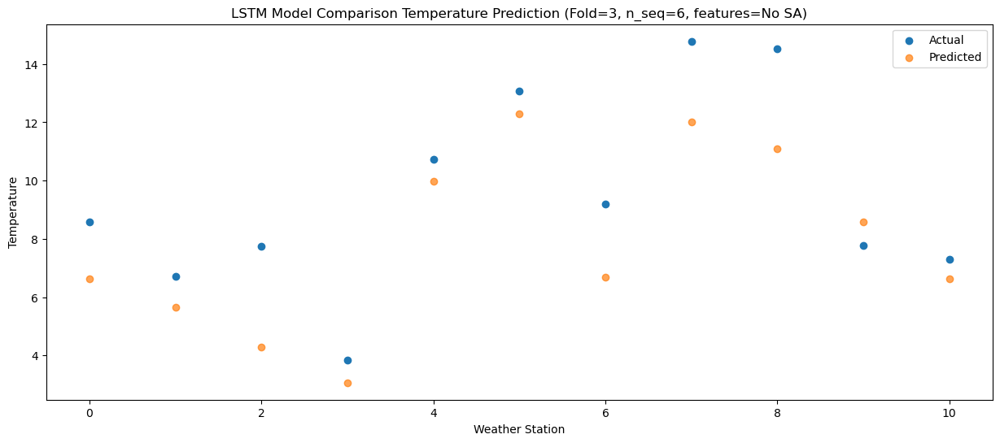

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.94   4.068491
1                 1    3.00   3.077278
2                 2   10.05   1.714454
3                 3    2.51   0.496193
4                 4    6.87   7.420248
5                 5   10.35   9.723931
6                 6    9.28   4.124767
7                 7   17.63   9.453120
8                 8   15.45   8.532115
9                 9    7.65   5.993772
10               10    6.49   4.046604


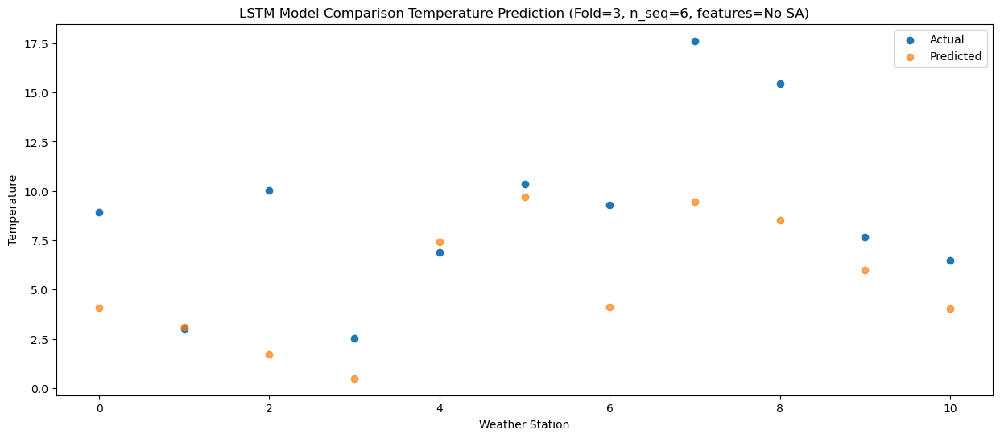

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.74  12.867923
1                 1   14.97  11.897728
2                 2   11.20  10.519330
3                 3   12.72   9.309058
4                 4   19.95  16.242808
5                 5   21.68  18.554440
6                 6   12.25  12.944326
7                 7   19.23  18.266095
8                 8   15.23  17.343520
9                 9   12.65  14.790042
10               10   13.68  12.839201


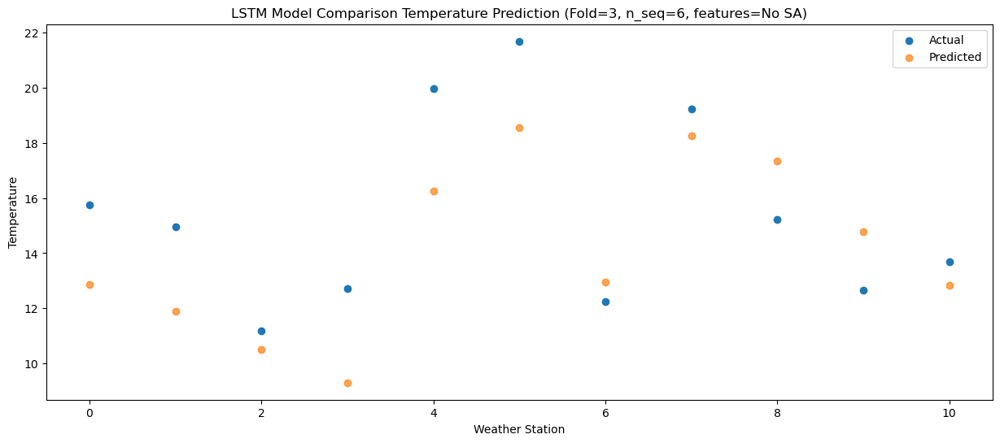

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.90  17.319764
1                 1   16.83  16.356621
2                 2   16.93  14.987186
3                 3   15.07  13.770342
4                 4   23.24  20.711618
5                 5   25.13  23.015937
6                 6   17.03  17.407494
7                 7   27.20  22.733658
8                 8   17.42  21.808178
9                 9   17.27  19.260205
10               10   18.55  17.310922


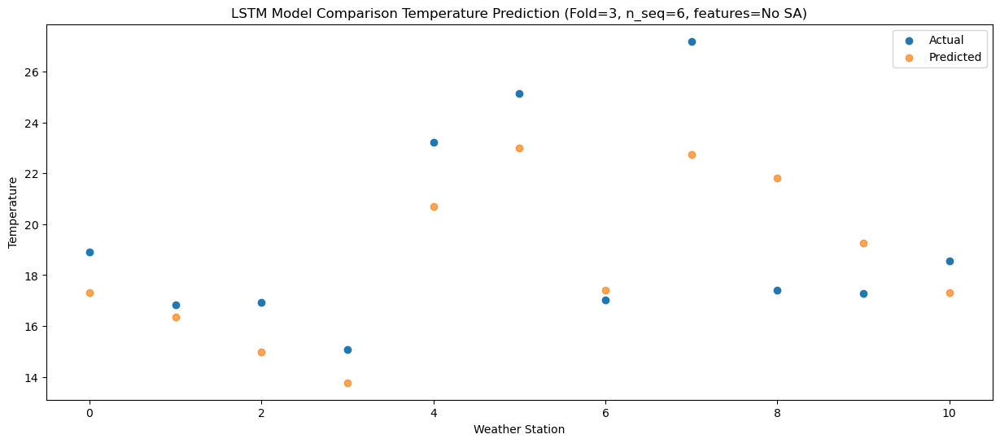

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.56  22.352855
1                 1   21.05  21.390361
2                 2   21.73  20.023559
3                 3   19.14  18.805815
4                 4   27.81  25.740270
5                 5   29.41  28.049404
6                 6   22.08  22.437896
7                 7   31.63  27.766881
8                 8   21.71  26.842300
9                 9   22.10  24.295749
10               10   22.81  22.346948


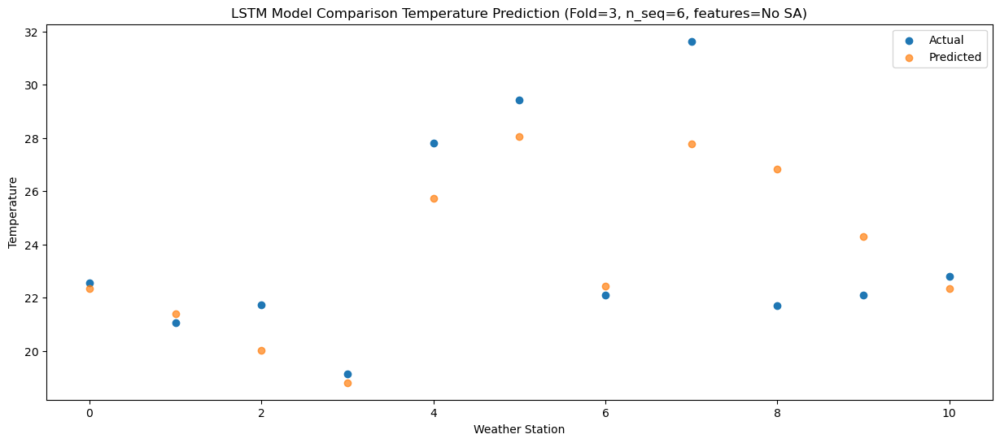

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.62  29.723540
1                 1   27.76  28.760255
2                 2   26.58  27.407888
3                 3   25.06  26.183123
4                 4   35.29  33.111740
5                 5   36.12  35.426995
6                 6   29.47  29.817141
7                 7   39.27  35.159016
8                 8   23.41  34.230684
9                 9   27.97  31.681202
10               10   28.98  29.729972


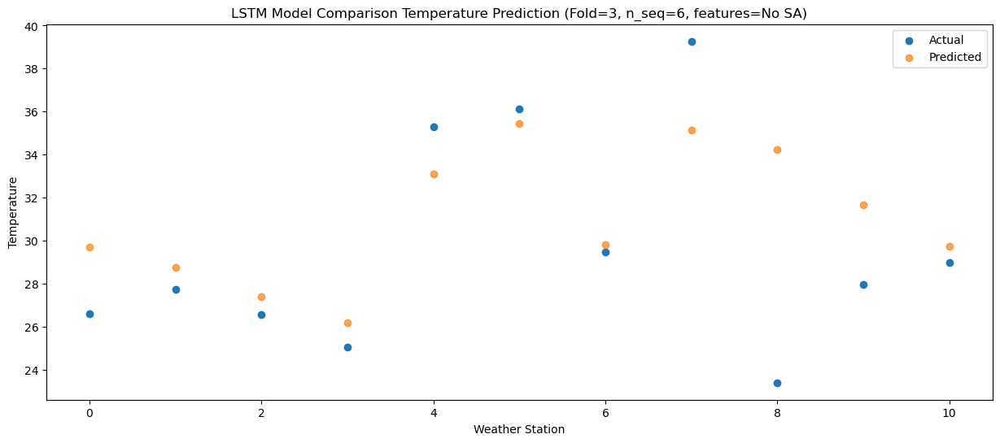

Model: "sequential_506"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1012 (LSTM)            (1, 1, 512)               5083136   
                                                                 
 dropout_1012 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1013 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1013 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1518 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1519 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1520 (Dense)          (1, 6)                 

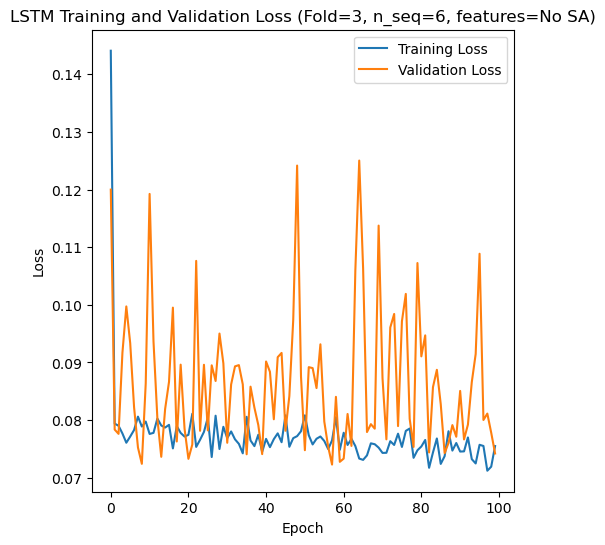

Epoch 1/100
84/84 [==============================] - 39s 174ms/step - loss: 0.2410 - accuracy: 0.4643 - mae: 0.1974 - rmse: 0.2410 - mape: 31.6067 - pearson: 0.5775 - val_loss: 0.1150 - val_accuracy: 0.2000 - val_mae: 0.0895 - val_rmse: 0.1150 - val_mape: 15.3753 - val_pearson: 0.6045
Epoch 2/100
84/84 [==============================] - 8s 93ms/step - loss: 0.0790 - accuracy: 0.7143 - mae: 0.0633 - rmse: 0.0790 - mape: 10.9921 - pearson: 0.7623 - val_loss: 0.0999 - val_accuracy: 0.2000 - val_mae: 0.0738 - val_rmse: 0.0999 - val_mape: 13.3234 - val_pearson: 0.7370
Epoch 3/100
84/84 [==============================] - 8s 95ms/step - loss: 0.0752 - accuracy: 0.6429 - mae: 0.0601 - rmse: 0.0752 - mape: 10.5101 - pearson: 0.7484 - val_loss: 0.0935 - val_accuracy: 0.7000 - val_mae: 0.0758 - val_rmse: 0.0935 - val_mape: 13.2631 - val_pearson: 0.7930
Epoch 4/100
84/84 [==============================] - 8s 96ms/step - loss: 0.0778 - accuracy: 0.6429 - mae: 0.0618 - rmse: 0.0778 - mape: 10.8555 -

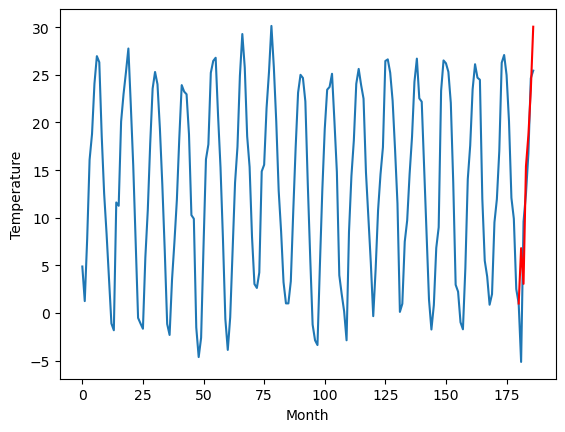

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.57		5.85		-2.72
12.00		2.11		-9.89
13.60		14.43		0.83
15.04		17.67		2.63
19.08		22.37		3.29
20.71		29.02		8.31
[180, 181, 182, 183, 184, 185, 186]
[14.25, 5.847460384368897, 2.107543821334839, 14.432967061996461, 17.666757698059083, 22.37287389755249, 29.018702144622804]


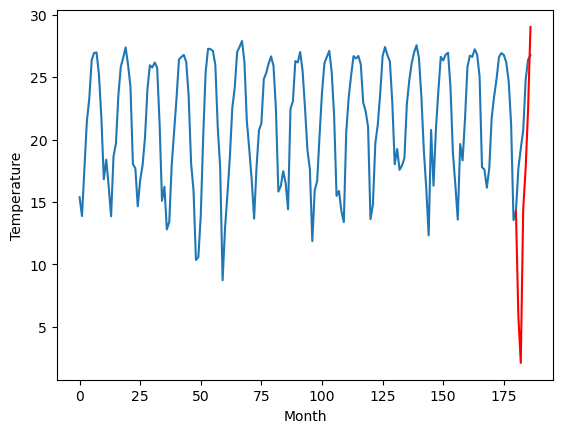

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.52		4.47		-2.05
4.60		0.72		-3.88
13.93		13.05		-0.88
15.00		16.29		1.29
19.47		21.00		1.53
23.73		27.64		3.91
[180, 181, 182, 183, 184, 185, 186]
[9.06, 4.467713584899903, 0.7220144176483156, 13.052878370285034, 16.287856092453005, 20.996330728530886, 27.64292811393738]


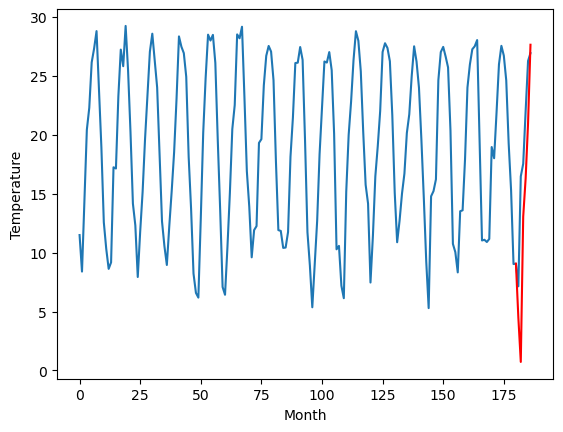

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.37		3.27		-1.10
0.91		-0.48		-1.39
11.87		11.87		-0.00
13.56		15.11		1.55
17.72		19.82		2.10
23.40		26.46		3.06
[180, 181, 182, 183, 184, 185, 186]
[7.48, 3.2743614101409912, -0.476115665435791, 11.869394817352294, 15.107215681076049, 19.816467084884643, 26.463227071762084]


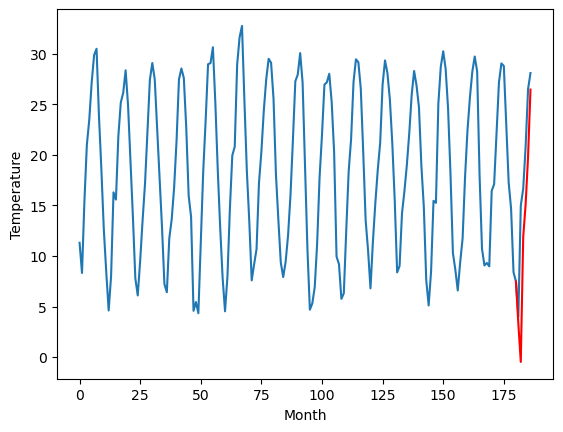

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.61		10.20		-1.41
7.72		6.45		-1.27
18.64		18.80		0.16
20.82		22.04		1.22
24.35		26.75		2.40
31.20		33.40		2.20
[180, 181, 182, 183, 184, 185, 186]
[7.33, 10.200118503570557, 6.45167823791504, 18.798367462158204, 22.039520225524903, 26.753394565582276, 33.396923027038575]


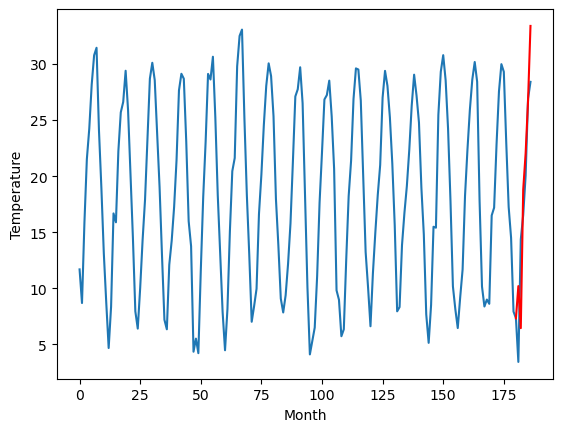

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.42		12.51		-0.91
11.85		8.77		-3.08
21.10		21.11		0.01
23.33		24.35		1.02
28.82		29.07		0.25
33.78		35.71		1.93
[180, 181, 182, 183, 184, 185, 186]
[6.59, 12.512141485214233, 8.768743057250976, 21.112658042907714, 24.353112239837646, 29.074800033569336, 35.710997600555416]


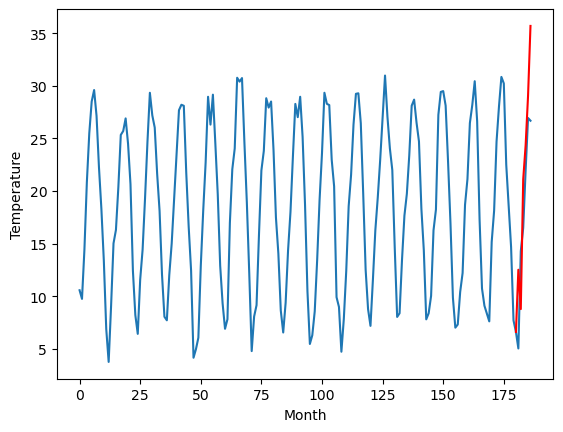

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.14		6.90		-2.24
9.81		3.17		-6.64
16.21		15.50		-0.71
18.94		18.73		-0.21
22.39		23.45		1.06
26.41		30.09		3.68
[180, 181, 182, 183, 184, 185, 186]
[6.04, 6.904595050811768, 3.1703814601898195, 15.495583448410034, 18.72972336769104, 23.45068922996521, 30.08848038673401]


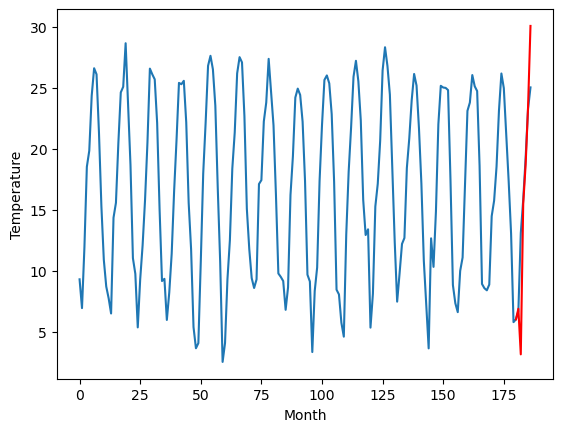

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.56		12.23		-0.33
8.95		8.48		-0.47
21.22		20.81		-0.41
23.12		24.04		0.92
27.16		28.76		1.60
33.46		35.41		1.95
[180, 181, 182, 183, 184, 185, 186]
[3.13, 12.225275020599366, 8.479305963516236, 20.811587076187134, 24.042108755111695, 28.759785871505738, 35.41139243125916]


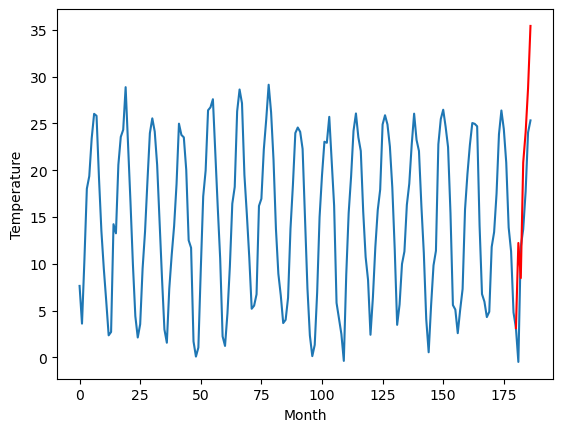

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		11.27		-0.45
8.36		7.53		-0.83
20.33		19.87		-0.46
23.98		23.11		-0.87
28.39		27.82		-0.57
35.63		34.48		-1.15
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 11.273665475845338, 7.528870868682862, 19.86886148452759, 23.111354398727418, 27.81720929145813, 34.480014371871945]


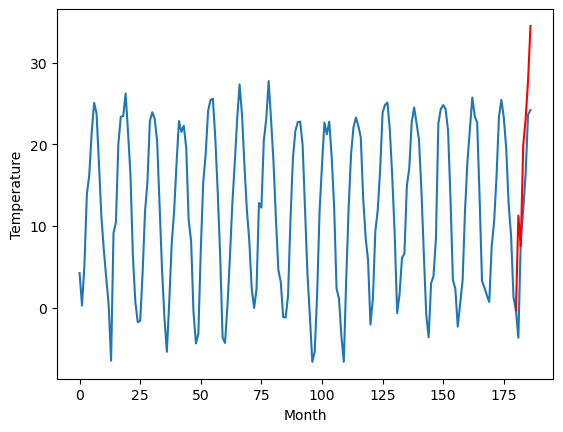

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.76		8.76		-0.00
4.32		5.01		0.69
18.18		17.35		-0.83
21.89		20.61		-1.28
26.67		25.31		-1.36
34.06		31.97		-2.09
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 8.756111183166503, 5.0073540592193595, 17.354814805984496, 20.605515518188476, 25.307828941345214, 31.972276248931884]


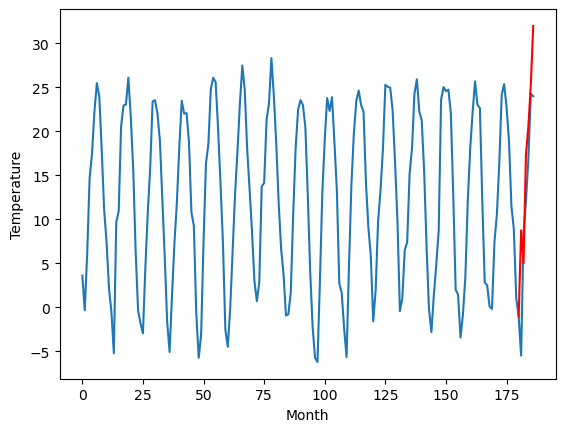

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.93		6.81		-0.12
4.69		3.07		-1.62
14.58		15.41		0.83
18.38		18.66		0.28
22.91		23.36		0.45
29.80		30.03		0.23
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 6.808632230758667, 3.066361045837402, 15.407815551757812, 18.663549280166627, 23.35865960121155, 30.032315587997438]


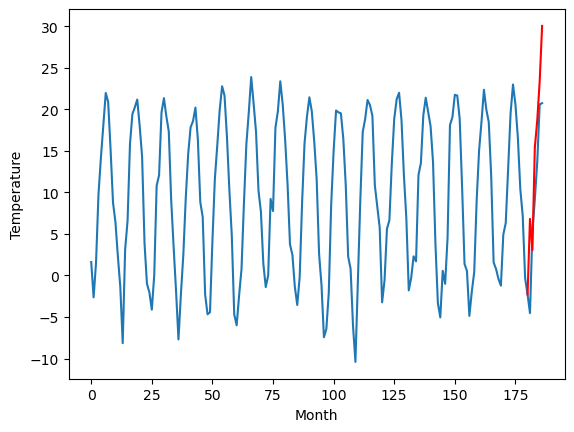

RangeIndex(start=1, stop=12, step=1)
[7.340000000000001, 8.569999999999999, 6.520000000000002, 4.370000000000001, 11.610000000000001, 13.419999999999998, 9.139999999999999, 12.56, 11.72, 8.759999999999998, 6.93]
[6.816621160507202, 5.847460384368897, 4.467713584899903, 3.2743614101409912, 10.200118503570557, 12.512141485214233, 6.904595050811768, 12.225275020599366, 11.273665475845338, 8.756111183166503, 6.808632230758667]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.816621
1                 1    8.57   5.847460
2                 2    6.52   4.467714
3                 3    4.37   3.274361
4                 4   11.61  10.200119
5                 5   13.42  12.512141
6                 6    9.14   6.904595
7                 7   12.56  12.225275
8                 8   11.72  11.273665
9                 9    8.76   8.756111
10               10    6.93   6.808632


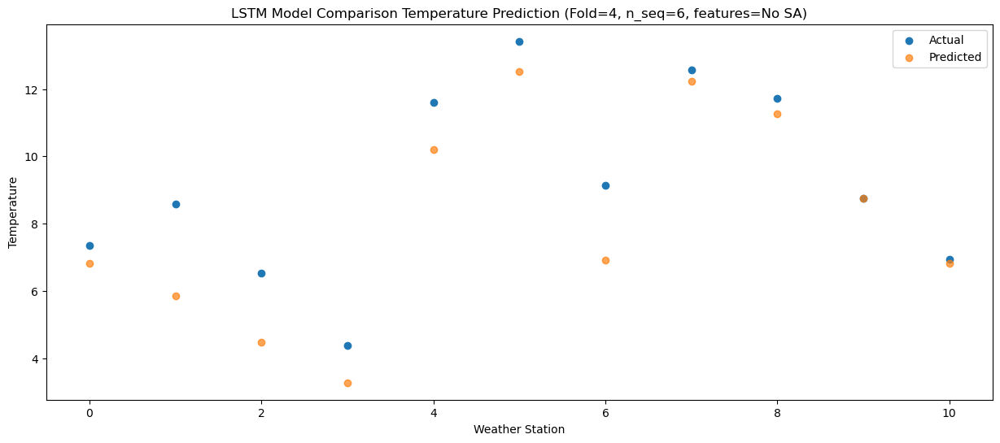

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.21   3.071429
1                 1   12.00   2.107544
2                 2    4.60   0.722014
3                 3    0.91  -0.476116
4                 4    7.72   6.451678
5                 5   11.85   8.768743
6                 6    9.81   3.170381
7                 7    8.95   8.479306
8                 8    8.36   7.528871
9                 9    4.32   5.007354
10               10    4.69   3.066361


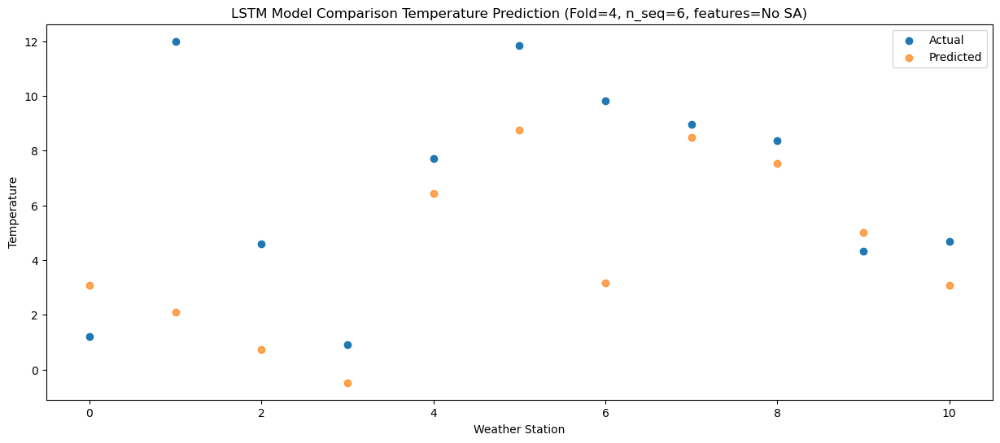

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.94  15.413064
1                 1   13.60  14.432967
2                 2   13.93  13.052878
3                 3   11.87  11.869395
4                 4   18.64  18.798367
5                 5   21.10  21.112658
6                 6   16.21  15.495583
7                 7   21.22  20.811587
8                 8   20.33  19.868861
9                 9   18.18  17.354815
10               10   14.58  15.407816


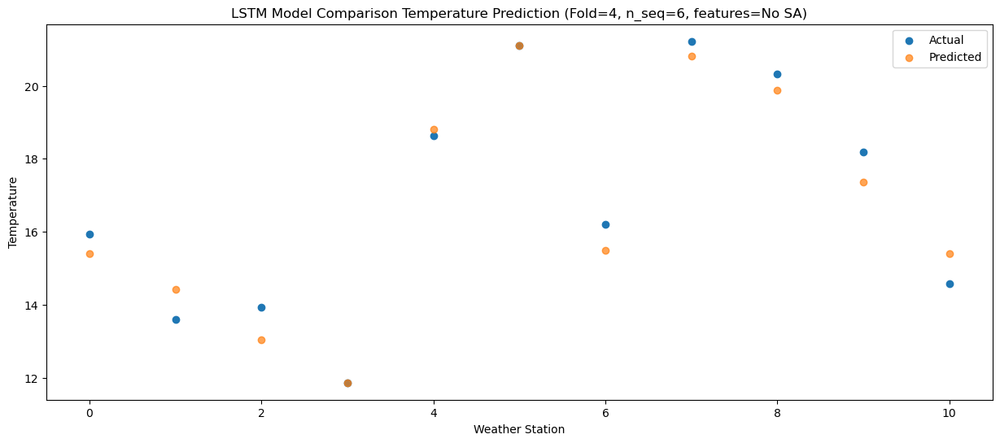

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.85  18.664740
1                 1   15.04  17.666758
2                 2   15.00  16.287856
3                 3   13.56  15.107216
4                 4   20.82  22.039520
5                 5   23.33  24.353112
6                 6   18.94  18.729723
7                 7   23.12  24.042109
8                 8   23.98  23.111354
9                 9   21.89  20.605516
10               10   18.38  18.663549


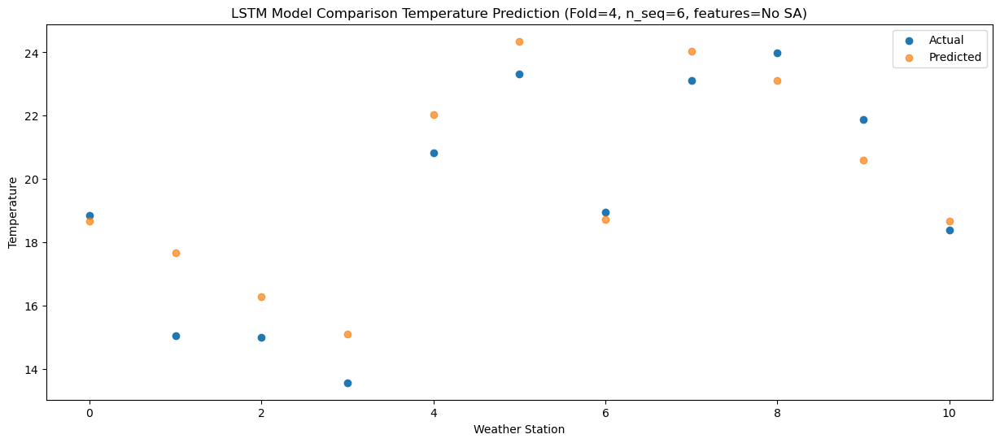

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.06  23.372783
1                 1   19.08  22.372874
2                 2   19.47  20.996331
3                 3   17.72  19.816467
4                 4   24.35  26.753395
5                 5   28.82  29.074800
6                 6   22.39  23.450689
7                 7   27.16  28.759786
8                 8   28.39  27.817209
9                 9   26.67  25.307829
10               10   22.91  23.358660


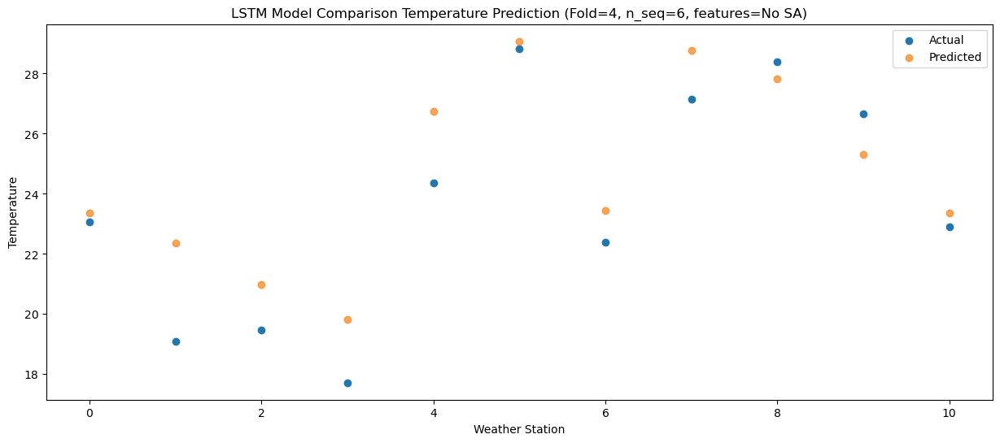

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   30.97  30.048028
1                 1   20.71  29.018702
2                 2   23.73  27.642928
3                 3   23.40  26.463227
4                 4   31.20  33.396923
5                 5   33.78  35.710998
6                 6   26.41  30.088480
7                 7   33.46  35.411392
8                 8   35.63  34.480014
9                 9   34.06  31.972276
10               10   29.80  30.032316


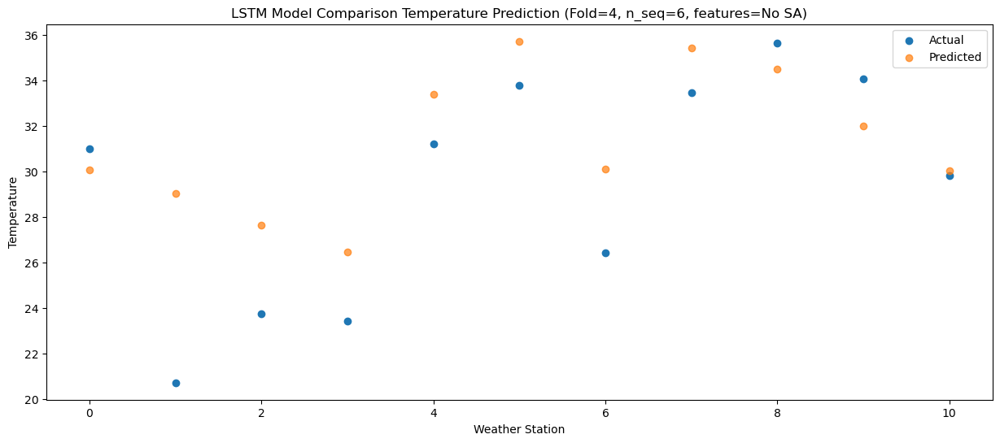

Model: "sequential_507"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1014 (LSTM)            (1, 1, 512)               5083136   
                                                                 
 dropout_1014 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1015 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1015 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1521 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1522 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1523 (Dense)          (1, 6)                 

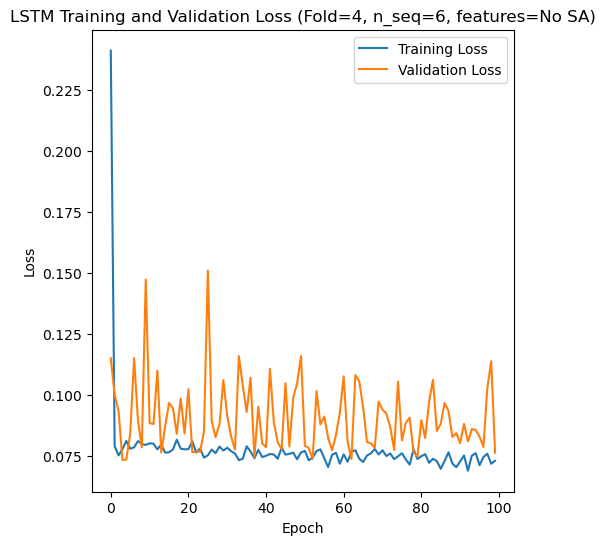

[[1.0801388479311131, 2.6933024989708403, 1.3442352448211843, 1.560659004802788, 2.371410513799852, 3.985680931470468], [1.0011190584724203, 3.8833743533257508, 1.155922496193859, 0.7317749195900778, 1.0266801210686354, 2.452590366622433], [1.4505619084210537, 3.092725610593119, 2.84740697170957, 3.3736897684249425, 3.794929981692183, 5.784973003561132], [2.031029273177532, 4.747987711617622, 2.420796619253539, 2.410015129476771, 2.2511692119529303, 3.887599367497197], [1.3893575885931375, 4.016941437529798, 0.6046884109432902, 1.239499964606744, 1.6397397538961402, 3.3872532509692452]]
[[0.9644164605542432, 2.3194673610120935, 0.98431579928697, 1.2112875984877944, 1.9639086470907465, 3.430316179762383], [0.9556184144453567, 3.3639877986907964, 0.9557916901328345, 0.6504257284511219, 0.9079660289937809, 2.123633141517639], [1.3823671653053984, 2.5497480112856086, 1.8539522454955366, 2.6147187868031576, 2.7369985309514138, 4.6137147008289], [1.7212851871143684, 3.711279984387484, 2.1473

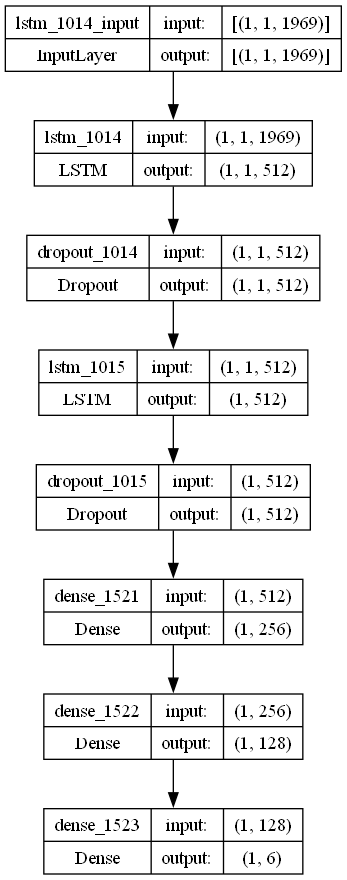

In [11]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr = 0.008178045909127072
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 512
    dropout_rate = 0.14852115505240665

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S6_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)